In [ ]:
# Install the Kaggle library
!pip install kaggle

# Upload your Kaggle API key (kaggle.json)
from google.colab import files
uploaded = files.upload()

# Move the Kaggle API key to the required directory
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the Horse2Zebra dataset from Kaggle
!kaggle datasets download -d balraj98/horse2zebra-dataset

# Unzip the downloaded dataset
!unzip horse2zebra-dataset.zip -d horse2zebra_dataset

# Check the contents of the dataset folder
!ls horse2zebra_dataset


Saving kaggle.json to kaggle.json
100% 111M/111M [00:03<00:00, 44.2MB/s]
100% 111M/111M [00:03<00:00, 36.2MB/s]
Archive:  horse2zebra-dataset.zip
  inflating: horse2zebra_dataset/metadata.csv  
  inflating: horse2zebra_dataset/testA/n02381460_1000.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1010.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1030.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1090.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1100.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1110.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1120.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1160.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_120.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1210.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1260.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1300.jpg  
  inflating: horse2zebra_dataset/testA/n02381460_1350.jpg  
  inflating: horse2zebra_da

Number of training images in domain A: 1067
Number of training images in domain B: 1334
Number of testing images in domain A: 120
Number of testing images in domain B: 140
Training images from domain A:


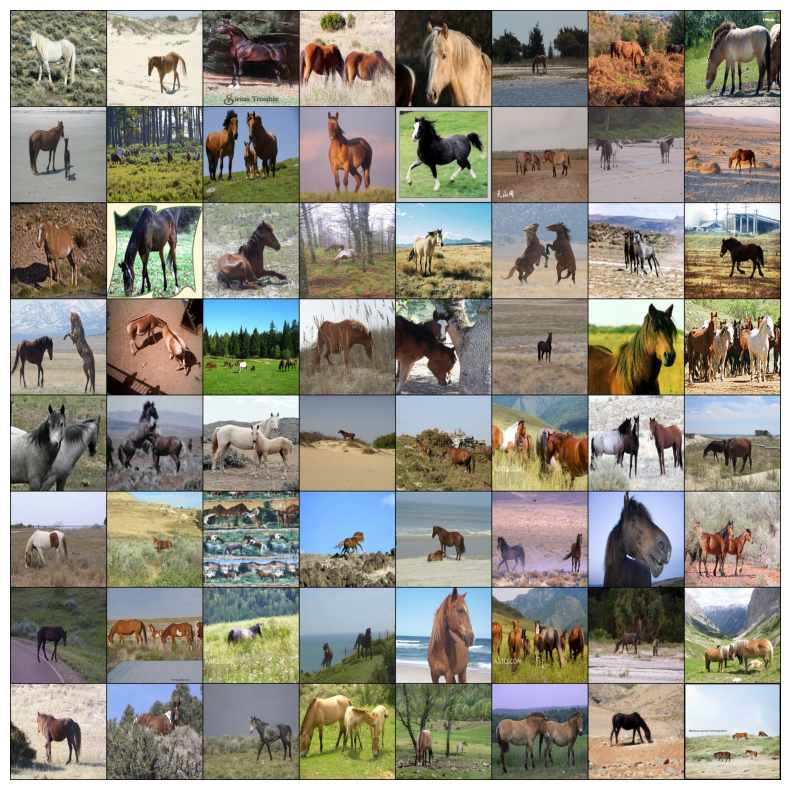

Training images from domain B:


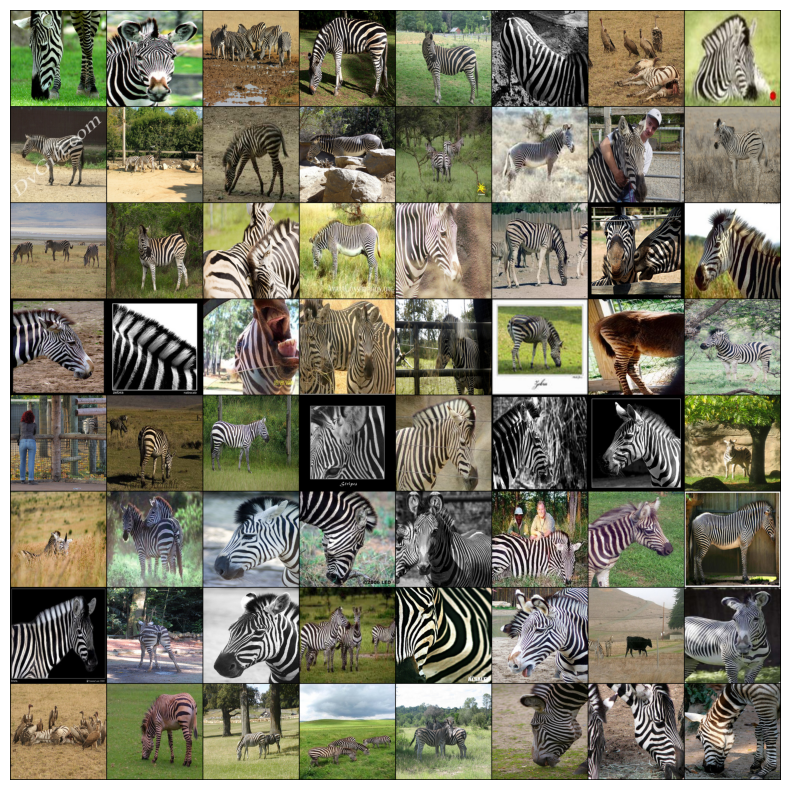

Testing images from domain A:


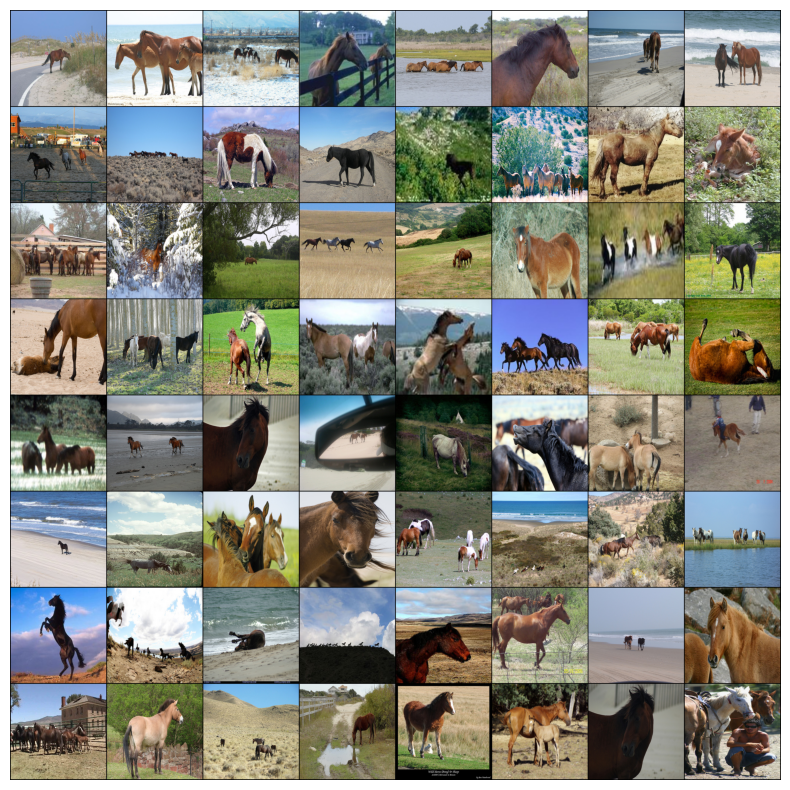

Testing images from domain B:


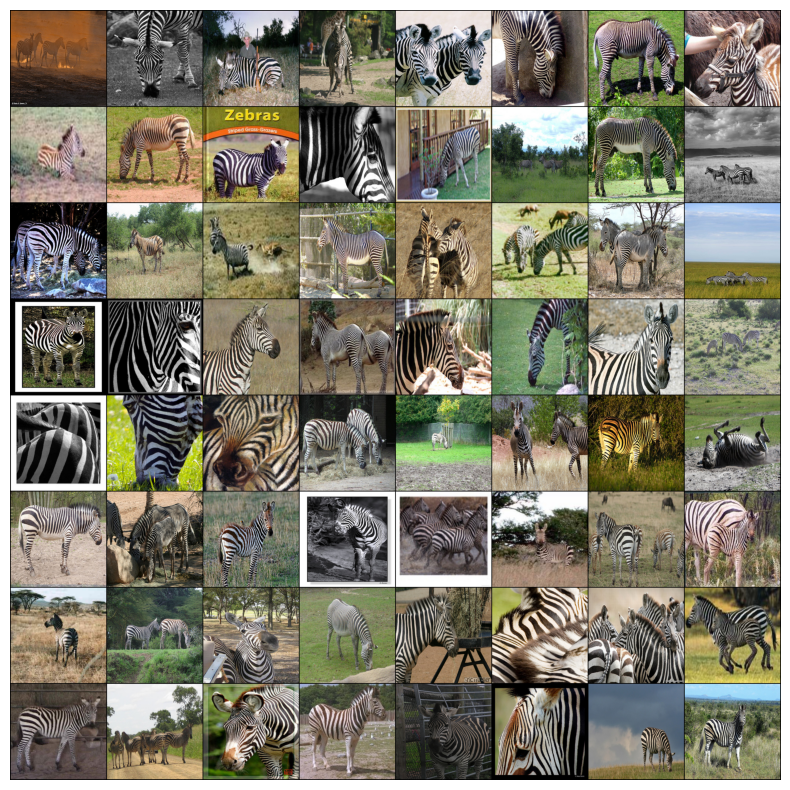

In [ ]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Define a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, data_path, transform=None):
        """
        Custom dataset class to load images from a directory.

        Args:
            data_path (str): Path to the dataset directory.
            transform (callable, optional): Optional transform to be applied to the images.
        """
        self.data_path = data_path
        self.image_files = os.listdir(data_path)
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_path, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define paths to the dataset folders
train_data_path_A = '/content/horse2zebra_dataset/trainA'
train_data_path_B = '/content/horse2zebra_dataset/trainB'
test_data_path_A = '/content/horse2zebra_dataset/testA'
test_data_path_B = '/content/horse2zebra_dataset/testB'

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

# Load datasets and create data loaders
train_dataset_A = CustomDataset(data_path=train_data_path_A, transform=transform)
train_dataset_B = CustomDataset(data_path=train_data_path_B, transform=transform)
train_loader_A = DataLoader(train_dataset_A, batch_size=64, shuffle=True)
train_loader_B = DataLoader(train_dataset_B, batch_size=64, shuffle=True)

test_dataset_A = CustomDataset(data_path=test_data_path_A, transform=transform)
test_dataset_B = CustomDataset(data_path=test_data_path_B, transform=transform)
test_loader_A = DataLoader(test_dataset_A, batch_size=64, shuffle=False)
test_loader_B = DataLoader(test_dataset_B, batch_size=64, shuffle=False)

# Display the number of images in each dataset
print(f"Number of training images in domain A: {len(train_dataset_A)}")
print(f"Number of training images in domain B: {len(train_dataset_B)}")
print(f"Number of testing images in domain A: {len(test_dataset_A)}")
print(f"Number of testing images in domain B: {len(test_dataset_B)}")

# Function to display a grid of images
def show_images(images):
    """
    Display a grid of images.

    Args:
        images (Tensor): Batch of images to display.
    """
    # Create a grid of images
    grid = make_grid(images, nrow=8, padding=2, normalize=True)
    # Convert tensor to numpy array
    grid = grid.permute(1, 2, 0).numpy()
    # Display the grid of images
    plt.figure(figsize=(20, 10))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

# Display a batch of training images from domain A
print("Training images from domain A:")
for images in train_loader_A:
    show_images(images)
    break  # Only show the first batch of images

# Display a batch of training images from domain B
print("Training images from domain B:")
for images in train_loader_B:
    show_images(images)
    break  # Only show the first batch of images

# Display a batch of testing images from domain A
print("Testing images from domain A:")
for images in test_loader_A:
    show_images(images)
    break  # Only show the first batch of images

# Display a batch of testing images from domain B
print("Testing images from domain B:")
for images in test_loader_B:
    show_images(images)
    break  # Only show the first batch of images


In [ ]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
import matplotlib.pyplot as plt
import random

class CustomDataset(Dataset):
    def __init__(self, data_path, num_images=5, transform=None):
        self.data_path = data_path
        self.image_files = os.listdir(data_path)[:num_images]  # Select a subset of images
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_path, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define paths to the dataset folders
train_data_path_A = '/content/horse2zebra_dataset/trainA'
train_data_path_B = '/content/horse2zebra_dataset/trainB'

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

# Load a small subset of the training dataset
num_images = 5  # Number of images to use for training
train_dataset_A = CustomDataset(data_path=train_data_path_A, num_images=num_images, transform=transform)
train_dataset_B = CustomDataset(data_path=train_data_path_B, num_images=num_images, transform=transform)

# Display images from domain A
print("Images from domain A:")
for idx in range(num_images):
    image_A = train_dataset_A[idx].permute(1, 2, 0)  # Change tensor shape for display
    plt.subplot(1, num_images, idx + 1)
    plt.imshow(image_A)
    plt.axis('off')
plt.show()

# Display images from domain B
print("Images from domain B:")
for idx in range(num_images):
    image_B = train_dataset_B[idx].permute(1, 2, 0)  # Change tensor shape for display
    plt.subplot(1, num_images, idx + 1)
    plt.imshow(image_B)
    plt.axis('off')
plt.show()


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Define paths to the dataset folders
test_data_path_A = '/content/horse2zebra_dataset/testA'
test_data_path_B = '/content/horse2zebra_dataset/testB'

# Generator architecture
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )

        # Residual Blocks
        self.residual_blocks = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        encoded = self.encoder(x)

        # Residual Blocks
        residual = self.residual_blocks(encoded)

        # Decoder
        decoded = self.decoder(residual + encoded)

        return decoded

# Discriminator architecture
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=1)
        )

    def forward(self, x):
        return self.model(x)

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

# Load the testing dataset
class CustomDataset(Dataset):
    def __init__(self, data_path, num_images=5, transform=None):
        self.data_path = data_path
        self.image_files = os.listdir(data_path)[:num_images]  # Select a subset of images
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_path, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

num_images = 5  # Number of images to use for testing
test_dataset_A = CustomDataset(data_path=test_data_path_A, num_images=num_images, transform=transform)
test_dataset_B = CustomDataset(data_path=test_data_path_B, num_images=num_images, transform=transform)
test_loader_A = DataLoader(test_dataset_A, batch_size=1, shuffle=False)
test_loader_B = DataLoader(test_dataset_B, batch_size=1, shuffle=False)

# Load the models
generator_A2B = Generator()
generator_B2A = Generator()
discriminator_A = Discriminator()
discriminator_B = Discriminator()

# Example of displaying a batch of images from the testing dataset
def show_images_from_loader(loader):
    for batch in loader:
        show_images(batch)
        break

def show_images(images):
    # Create a grid of images
    grid = make_grid(images, nrow=5, padding=2, normalize=True)
    # Convert tensor to numpy array
    grid = grid.permute(1, 2, 0).numpy()
    # Display the grid of images
    plt.figure(figsize=(15, 6))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

# Display a batch of images from dataset A
print("Images from dataset A:")
show_images_from_loader(test_loader_A)

# Display a batch of images from dataset B
print("Images from dataset B:")
show_images_from_loader(test_loader_B)


Number of training images in domain A: 5
Number of training images in domain B: 5
Number of testing images in domain A: 5
Number of testing images in domain B: 5


In [ ]:
import itertools


In [ ]:
# Define loss functions
criterion_adversarial = nn.BCELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

lambda_cycle = 10.0
log_interval = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

lambda_adversarial = 1.0

In [ ]:
import torch.optim as optim

# Initialize the generators and discriminators
G_A = Generator()
G_B = Generator()
D_A = Discriminator()
D_B = Discriminator()

# Define the optimizers for the generators and discriminators
optimizer_G = optim.Adam(list(G_A.parameters()) + list(G_B.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(list(D_A.parameters()) + list(D_B.parameters()), lr=0.0002, betas=(0.5, 0.999))

# Define the loss functions
criterion_GAN = nn.BCEWithLogitsLoss()  # Use Binary Cross Entropy with Logits loss for GAN loss
criterion_cycle = nn.L1Loss()            # Use L1 loss for cycle consistency loss

# Training loop
num_epochs = 10  # Set the number of epochs
for epoch in range(num_epochs):
    for i, (real_A, real_B) in enumerate(zip(train_loader_A, train_loader_B)):
        # Set model input
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        ######################
        #  Train Generators  #
        ######################

        optimizer_G.zero_grad()

        # GAN loss
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B)
        loss_GAN_AB = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A)
        loss_GAN_BA = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        # Cycle consistency loss
        reconstructed_A = G_B(fake_B)
        loss_cycle_A = criterion_cycle(reconstructed_A, real_A)

        reconstructed_B = G_A(fake_A)
        loss_cycle_B = criterion_cycle(reconstructed_B, real_B)

        # Total loss
        loss_G =  loss_GAN_AB + loss_GAN_BA + 10 * (loss_cycle_A + loss_cycle_B)  # Adjust cycle loss weight

        loss_G.backward()
        optimizer_G.step()

        ######################
        #  Train Discriminators  #
        ######################

        optimizer_D.zero_grad()

        # Discriminator loss for domain A
        pred_real = D_A(real_A)
        loss_D_real_A = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A.detach())
        loss_D_fake_A = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5

        # Discriminator loss for domain B
        pred_real = D_B(real_B)
        loss_D_real_B = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B.detach())
        loss_D_fake_B = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5

        # Total loss
        loss_D = loss_D_A + loss_D_B

        loss_D.backward()
        optimizer_D.step()

        # Print losses
        if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch {i}, "
                f"Loss G: {loss_G.item()}, Loss D: {loss_D.item()}"
            )

    # Save models
    if (epoch + 1) % 5 == 0:
        torch.save(G_A.state_dict(), f"G_A_epoch{epoch+1}.pt")
        torch.save(G_B.state_dict(), f"G_B_epoch{epoch+1}.pt")
        torch.save(D_A.state_dict(), f"D_A_epoch{epoch+1}.pt")
        torch.save(D_B.state_dict(), f"D_B_epoch{epoch+1}.pt")


Epoch [0/5], Batch 0, Loss G: 2.5592920780181885, Loss D: 0.9309052228927612
Epoch [1/5], Batch 0, Loss G: 2.04880428314209, Loss D: 0.6368062496185303
Epoch [2/5], Batch 0, Loss G: 1.8518366813659668, Loss D: 0.5653316378593445
Epoch [3/5], Batch 0, Loss G: 1.8408715724945068, Loss D: 0.5324386358261108
Epoch [4/5], Batch 0, Loss G: 1.7309894561767578, Loss D: 0.4962018132209778


Epoch [0/5], Batch 0, Loss G: 10.626729965209961, Loss D: 0.5751442909240723


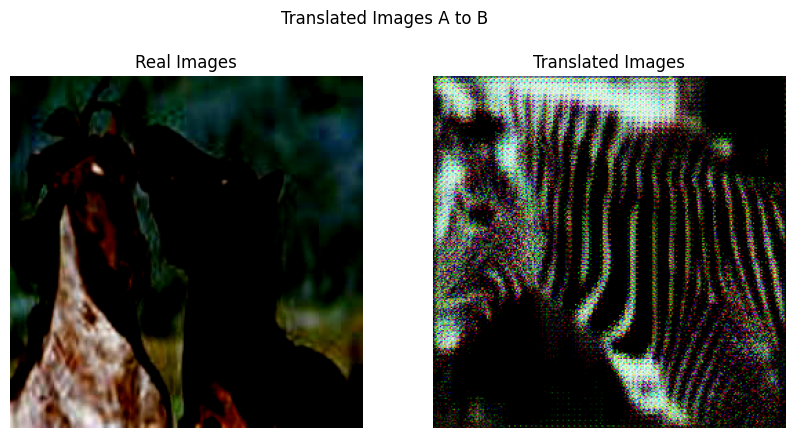

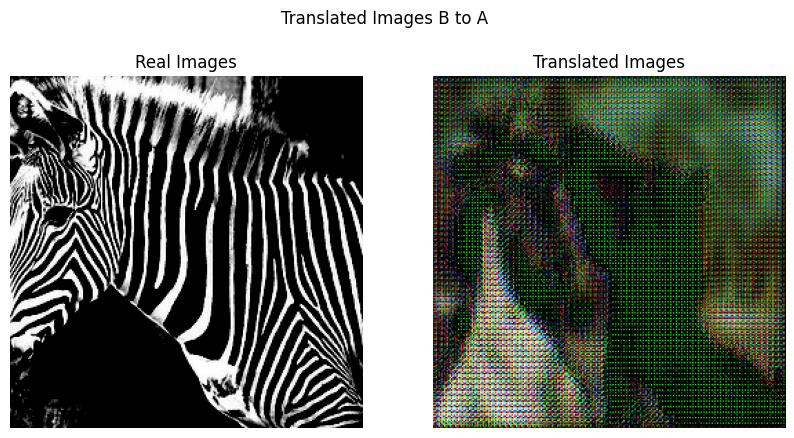

Epoch [1/5], Batch 0, Loss G: 3.577185869216919, Loss D: 0.49796053767204285


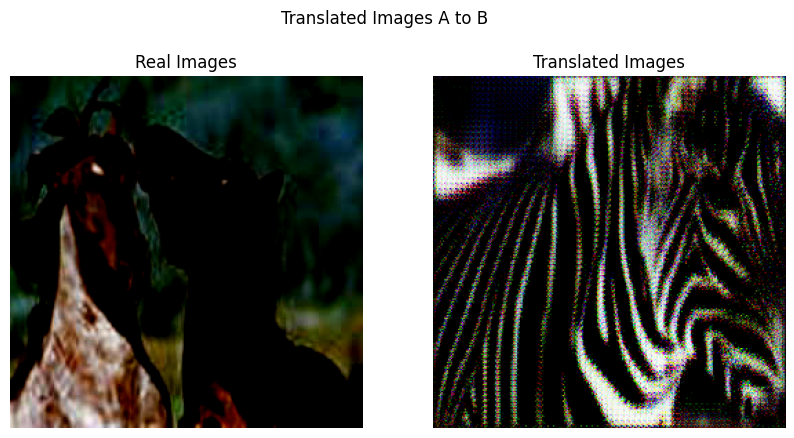

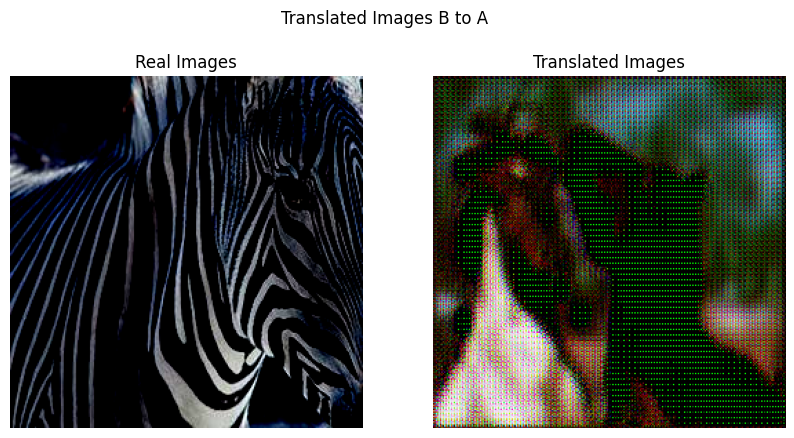

Epoch [2/5], Batch 0, Loss G: 3.616192102432251, Loss D: 0.44796425104141235


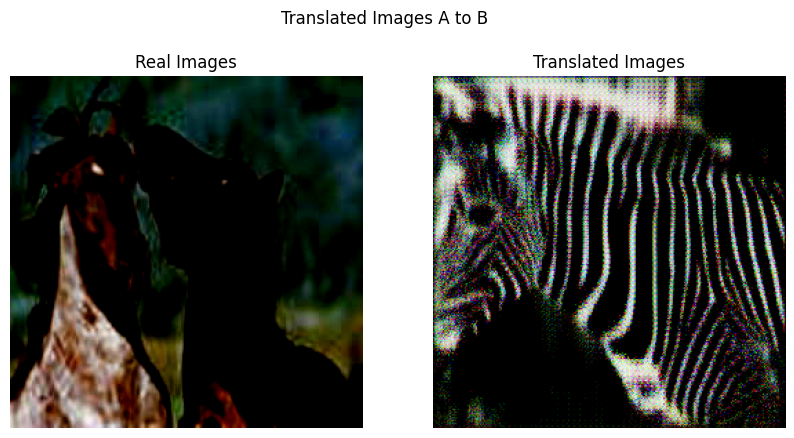

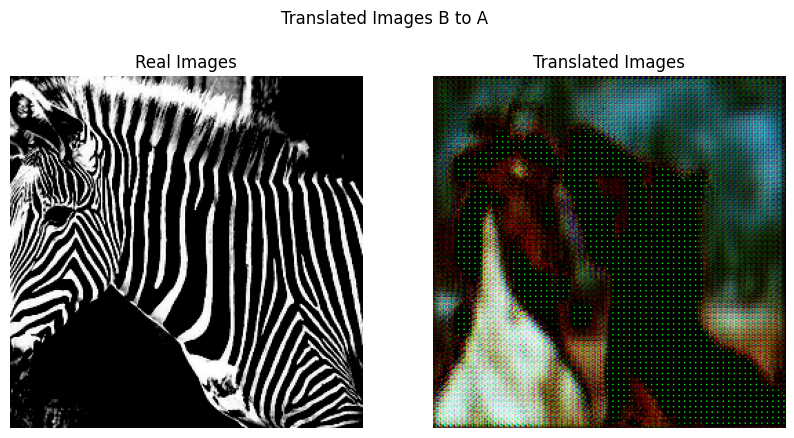

Epoch [3/5], Batch 0, Loss G: 2.9233572483062744, Loss D: 0.4732508957386017


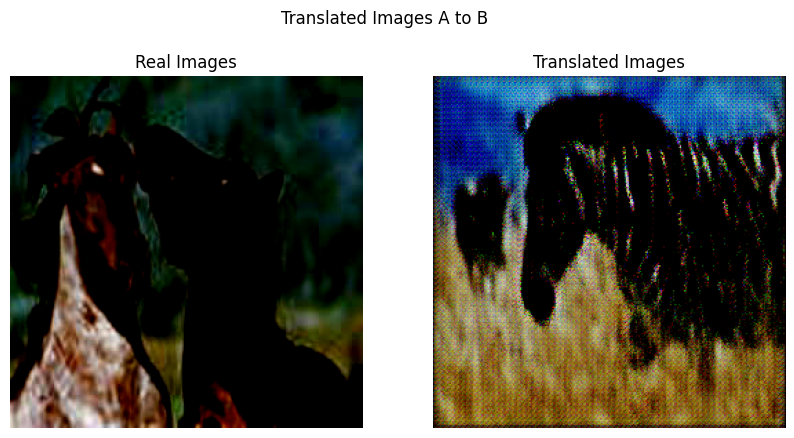

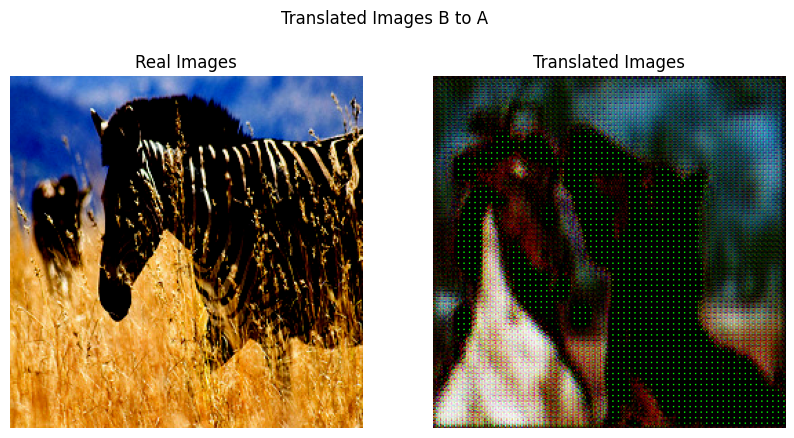

Epoch [4/5], Batch 0, Loss G: 4.071425437927246, Loss D: 0.4089115262031555


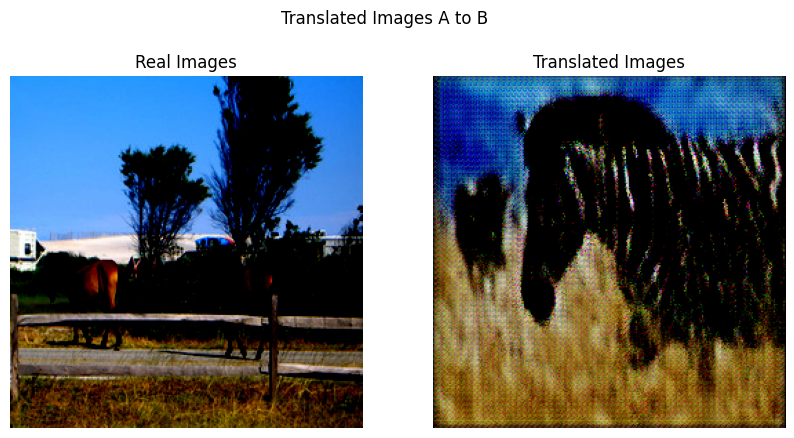

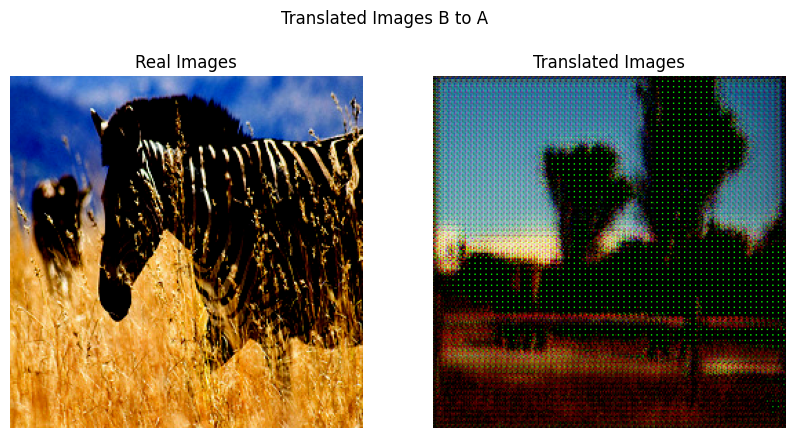

In [ ]:
import matplotlib.pyplot as plt

# Function to display a grid of translated images
def show_translated_images(real_images, translated_images, title):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Real Images')
    plt.imshow(make_grid(real_images, nrow=5).permute(1, 2, 0))
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.title('Translated Images')
    plt.imshow(make_grid(translated_images, nrow=5).permute(1, 2, 0))
    plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Training loop
num_epochs = 5  # Set the number of epochs
for epoch in range(num_epochs):
    for i, (real_A, real_B) in enumerate(zip(train_loader_A, train_loader_B)):
        # Set model input
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        ######################
        #  Train Generators  #
        ######################

        optimizer_G.zero_grad()

        # Identity loss
        loss_id_A = criterion_GAN(G_A(real_A), real_A)
        loss_id_B = criterion_GAN(G_B(real_B), real_B)

        # GAN loss
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B)
        loss_GAN_AB = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A)
        loss_GAN_BA = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        # Cycle consistency loss
        reconstructed_A = G_B(fake_B)
        loss_cycle_A = criterion_cycle(reconstructed_A, real_A)

        reconstructed_B = G_A(fake_A)
        loss_cycle_B = criterion_cycle(reconstructed_B, real_B)

        # Total loss
        loss_G =  loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B + (loss_id_A + loss_id_B) * 5.0

        loss_G.backward()
        optimizer_G.step()

        ######################
        #  Train Discriminators  #
        ######################

        optimizer_D.zero_grad()

        # Discriminator loss for domain A
        pred_real = D_A(real_A)
        loss_D_real_A = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A.detach())
        loss_D_fake_A = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5

        # Discriminator loss for domain B
        pred_real = D_B(real_B)
        loss_D_real_B = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B.detach())
        loss_D_fake_B = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5

        # Total loss
        loss_D = loss_D_A + loss_D_B

        loss_D.backward()
        optimizer_D.step()

        # Print losses
        if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch {i}, "
                f"Loss G: {loss_G.item()}, Loss D: {loss_D.item()}"
            )

    # Save models
    if (epoch + 1) % 5 == 0:
        torch.save(G_A.state_dict(), f"G_A_epoch{epoch+1}.pt")
        torch.save(G_B.state_dict(), f"G_B_epoch{epoch+1}.pt")
        torch.save(D_A.state_dict(), f"D_A_epoch{epoch+1}.pt")
        torch.save(D_B.state_dict(), f"D_B_epoch{epoch+1}.pt")

    # Visualize translated images after each epoch
    with torch.no_grad():
        fake_A = G_B(real_B)
        fake_B = G_A(real_A)
        show_translated_images(real_A, fake_A, f'Epoch {epoch+1}: Translated Images A to B')
        show_translated_images(real_B, fake_B, f'Epoch {epoch+1}: Translated Images B to A')


In [ ]:

# Lists to store losses
losses_G = []
losses_D = []

In [ ]:
import torch.optim as optim

# Initialize the generators and discriminators
G_A = Generator()
G_B = Generator()
D_A = Discriminator()
D_B = Discriminator()

# Define the optimizers for the generators and discriminators
optimizer_G = optim.Adam(list(G_A.parameters()) + list(G_B.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(list(D_A.parameters()) + list(D_B.parameters()), lr=0.0002, betas=(0.5, 0.999))

# Define the loss functions
criterion_GAN = nn.MSELoss()  # Mean Squared Error loss for GAN loss

# Initialize lists to store losses
losses_G = []
losses_D = []

# Training loop
num_epochs = 10  # Number of epochs
for epoch in range(num_epochs):
    for i, (real_A, real_B) in enumerate(zip(train_loader_A, train_loader_B)):
        # Set model input
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        ######################
        #  Train Generators  #
        ######################

        optimizer_G.zero_grad()

        # GAN loss
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B)
        loss_GAN_AB = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A)
        loss_GAN_BA = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        # Cycle consistency loss
        reconstructed_A = G_B(fake_B)
        loss_cycle_A = criterion_cycle(reconstructed_A, real_A)

        reconstructed_B = G_A(fake_A)
        loss_cycle_B = criterion_cycle(reconstructed_B, real_B)

        # Total loss for generators
        loss_G = loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B

        loss_G.backward()
        optimizer_G.step()

        ######################
        #  Train Discriminators  #
        ######################

        optimizer_D.zero_grad()

        # Discriminator loss for domain A
        pred_real = D_A(real_A)
        loss_D_real_A = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A.detach())
        loss_D_fake_A = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5

        # Discriminator loss for domain B
        pred_real = D_B(real_B)
        loss_D_real_B = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B.detach())
        loss_D_fake_B = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5

        # Total loss for discriminators
        loss_D = loss_D_A + loss_D_B

        loss_D.backward()
        optimizer_D.step()

        # Append losses to the lists
        losses_G.append(loss_G.item())
        losses_D.append(loss_D.item())

        # Print losses
        if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch {i}, "
                f"Loss G: {loss_G.item()}, Loss D: {loss_D.item()}"
            )

    # Save models
    if (epoch + 1) % 5 == 0:
        torch.save(G_A.state_dict(), f"G_A_epoch{epoch+1}.pt")
        torch.save(G_B.state_dict(), f"G_B_epoch{epoch+1}.pt")
        torch.save(D_A.state_dict(), f"D_A_epoch{epoch+1}.pt")
        torch.save(D_B.state_dict(), f"D_B_epoch{epoch+1}.pt")


Epoch [0/10], Batch 0, Loss G: 3.098691701889038, Loss D: 1.0564661026000977
Epoch [1/10], Batch 0, Loss G: 2.491006851196289, Loss D: 0.9401625990867615
Epoch [2/10], Batch 0, Loss G: 1.9047497510910034, Loss D: 0.6296426057815552
Epoch [3/10], Batch 0, Loss G: 2.8830881118774414, Loss D: 0.6188644170761108
Epoch [4/10], Batch 0, Loss G: 2.1671957969665527, Loss D: 0.5817123651504517
Epoch [5/10], Batch 0, Loss G: 2.2476370334625244, Loss D: 0.5206916928291321
Epoch [6/10], Batch 0, Loss G: 1.9780364036560059, Loss D: 0.4918711483478546
Epoch [7/10], Batch 0, Loss G: 1.979181170463562, Loss D: 0.5031779408454895
Epoch [8/10], Batch 0, Loss G: 1.9740166664123535, Loss D: 0.4353455901145935
Epoch [9/10], Batch 0, Loss G: 1.6760339736938477, Loss D: 0.42151206731796265


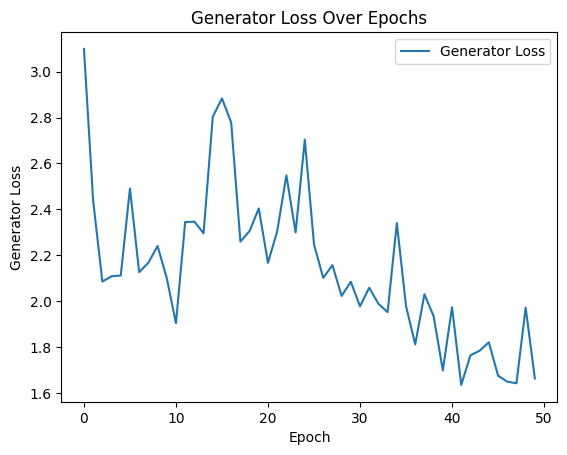

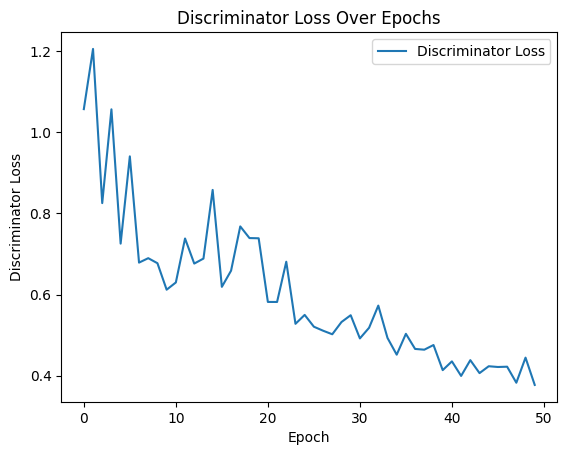

In [ ]:
import matplotlib.pyplot as plt

# Plot generator loss
plt.plot(losses_G, label='Generator Loss')
plt.xlabel('Epoch')
plt.ylabel('Generator Loss')
plt.title('Generator Loss Over Epochs')
plt.legend()
plt.show()

# Plot discriminator loss
plt.plot(losses_D, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Discriminator Loss')
plt.title('Discriminator Loss Over Epochs')
plt.legend()
plt.show()


In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision.utils import save_image
from torchvision import datasets
import itertools
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
discriminator = Discriminator(3)

total_params = sum(p.numel() for p in discriminator.parameters())
print(total_params)

35553


In [ ]:
generator = Generator(3, 3)

total_params = sum(p.numel() for p in generator.parameters())
print(total_params)

194051


In [ ]:


# Define a function to plot original and translated images
def plot_images(original, translated, title):
    original = original.detach().cpu()
    translated = translated.detach().cpu()
    fig, axes = plt.subplots(nrows=2, ncols=len(original), figsize=(12, 4))
    for i in range(len(original)):
        axes[0, i].imshow(original[i].permute(1, 2, 0))
        axes[0, i].set_title('Original')
        axes[0, i].axis('off')

        axes[1, i].imshow(translated[i].permute(1, 2, 0))
        axes[1, i].set_title('Translated')
        axes[1, i].axis('off')
    plt.suptitle(title)
    plt.show()



In [ ]:
# Define the training loop for CycleGAN with monitoring of losses and visualization of translated images
def train_cycle_gan(dataset, num_epochs=2, lr=0.0002, save_interval=5, save_dir='saved_models'):
    # Set the device based on GPU availability
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize the generators
    generator_AB = Generator().to(device)
    generator_BA = Generator().to(device)

    # Initialize the discriminators
    discriminator_A = Discriminator().to(device)
    discriminator_B = Discriminator().to(device)

    # Initialize the optimizers
    optimizer_G = optim.Adam(list(generator_AB.parameters()) + list(generator_BA.parameters()), lr=lr, betas=(0.5, 0.999))
    optimizer_D_A = optim.Adam(discriminator_A.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D_B = optim.Adam(discriminator_B.parameters(), lr=lr, betas=(0.5, 0.999))

    # Define loss functions (adversarial and cycle consistency)
    criterion_GAN = nn.MSELoss()
    criterion_cycle = nn.L1Loss()

    # Lists to store losses for visualization
    losses_G = []
    losses_D_A = []
    losses_D_B = []
    losses_cycle_A = []
    losses_cycle_B = []

    for epoch in range(num_epochs):
        for batch_idx, (zebra_images, horse_images) in enumerate(dataset):
            zebra_images = zebra_images.to(device)
            horse_images = horse_images.to(device)

            # Adversarial ground truths
            bs = zebra_images.shape[0]
            valid = torch.ones(bs, 1, device=device)
            fake = torch.zeros(bs, 1, device=device)

            # Train the generators

            optimizer_G.zero_grad()

            # Identity loss
            same_B = generator_AB(horse_images)
            loss_identity_B = criterion_cycle(same_B, horse_images)

            same_A = generator_BA(zebra_images)
            loss_identity_A = criterion_cycle(same_A, zebra_images)

            fake_B = generator_AB(zebra_images)
            pred_fake = discriminator_B(fake_B)
            loss_GAN_AB = criterion_GAN(pred_fake, valid)

            fake_A = generator_BA(horse_images)
            pred_fake = discriminator_A(fake_A)
            loss_GAN_BA = criterion_GAN(pred_fake, valid)

            recovered_A = generator_BA(fake_B)
            loss_cycle_A = criterion_cycle(recovered_A, zebra_images)

            recovered_B = generator_AB(fake_A)
            loss_cycle_B = criterion_cycle(recovered_B, horse_images)

            loss_G = loss_identity_A + loss_identity_B + loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B

            loss_G.backward()
            optimizer_G.step()

            # Train the discriminators

            optimizer_D_A.zero_grad()

            pred_real = discriminator_A(horse_images)
            loss_real = criterion_GAN(pred_real, valid)

            pred_fake = discriminator_A(fake_A.detach())
            loss_fake = criterion_GAN(pred_fake, fake)

            loss_D_A = 0.5 * (loss_real + loss_fake)

            loss_D_A.backward()
            optimizer_D_A.step()

            optimizer_D_B.zero_grad()

            pred_real = discriminator_B(zebra_images)
            loss_real = criterion_GAN(pred_real, valid)

            pred_fake = discriminator_B(fake_B.detach())
            loss_fake = criterion_GAN(pred_fake, fake)

            loss_D_B = 0.5 * (loss_real + loss_fake)

            loss_D_B.backward()
            optimizer_D_B.step()

            # Store losses for visualization
            losses_G.append(loss_G.item())
            losses_D_A.append(loss_D_A.item())
            losses_D_B.append(loss_D_B.item())
            losses_cycle_A.append(loss_cycle_A.item())
            losses_cycle_B.append(loss_cycle_B.item())

            # Print losses
            if batch_idx % 100 == 0:
                print(f"Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(dataset)}],"
                      f" G Loss: {loss_G.item():.4f}, D_A Loss: {loss_D_A.item():.4f}, D_B Loss: {loss_D_B.item():.4f},"
                      f" Cycle A Loss: {loss_cycle_A.item():.4f}, Cycle B Loss: {loss_cycle_B.item():.4f}")

            # Save generated images and plot them

            if batch_idx == 0:
                os.makedirs("output_images", exist_ok=True)
                save_image(fake_B, f"output_images/fake_B_{epoch}_{batch_idx}.png", normalize=True)
                save_image(fake_A, f"output_images/fake_A_{epoch}_{batch_idx}.png", normalize=True)
                plot_images(zebra_images, fake_B, title='Zebra to Horse Translation')
                plot_images(horse_images, fake_A, title='Horse to Zebra Translation')

        # Save models every few epochs
        if epoch % save_interval == 0:
            os.makedirs(save_dir, exist_ok=True)
            torch.save(generator_AB.state_dict(), os.path.join(save_dir, f'generator_AB_epoch_{epoch}.pt'))
            torch.save(generator_BA.state_dict(), os.path.join(save_dir, f'generator_BA_epoch_{epoch}.pt'))
            torch.save(discriminator_A.state_dict(), os.path.join(save_dir, f'discriminator_A_epoch_{epoch}.pt'))
            torch.save(discriminator_B.state_dict(), os.path.join(save_dir, f'discriminator_B_epoch_{epoch}.pt'))

    # Plot and save losses
    plt.figure(figsize=(10, 5))
    plt.plot(losses_G, label='Generator Loss')
    plt.plot(losses_D_A, label='Discriminator A Loss')
    plt.plot(losses_D_B, label='Discriminator B Loss')
    plt.plot(losses_cycle_A, label='Cycle A Loss')
    plt.plot(losses_cycle_B, label='Cycle B Loss')
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Training Losses')
    plt.legend()
    plt.savefig('training_losses.png')
    plt.show()


In [ ]:
class CycleGAN(nn.Module):
    def __init__(self, generator_AB, generator_BA, discriminator_A, discriminator_B):
        super(CycleGAN, self).__init__()
        self.generator_AB = generator_AB
        self.generator_BA = generator_BA
        self.discriminator_A = discriminator_A
        self.discriminator_B = discriminator_B

    def forward(self, real_A, real_B):
        # Translate images from domain A to domain B and vice versa
        fake_B = self.generator_AB(real_A)  # Translate images from domain A to domain B
        fake_A = self.generator_BA(real_B)  # Translate images from domain B to domain A

        # Reconstruction (cycle consistency)
        rec_A = self.generator_BA(fake_B)    # Reconstruct images from domain B to domain A (cycle)
        rec_B = self.generator_AB(fake_A)    # Reconstruct images from domain A to domain B (cycle)

        # Adversarial predictions
        pred_fake_A = self.discriminator_A(fake_A)  # Predictions for translated images in domain A
        pred_fake_B = self.discriminator_B(fake_B)  # Predictions for translated images in domain B

        return fake_B, fake_A, rec_A, rec_B, pred_fake_A, pred_fake_B


In [ ]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image

class HorseZebraDataset(Dataset):
    def __init__(self, root_zebra, root_horse, transform=None):
        self.root_zebra = root_zebra
        self.root_horse = root_horse
        self.zebra_files = os.listdir(root_zebra)
        self.horse_files = os.listdir(root_horse)
        self.transform = transform

    def __len__(self):
        return min(len(self.zebra_files), len(self.horse_files))

    def __getitem__(self, idx):
        zebra_img_path = os.path.join(self.root_zebra, self.zebra_files[idx])
        horse_img_path = os.path.join(self.root_horse, self.horse_files[idx])

        zebra_img = Image.open(zebra_img_path).convert('RGB')
        horse_img = Image.open(horse_img_path).convert('RGB')

        if self.transform:
            zebra_img, horse_img = self.transform(zebra_img, horse_img)

        return zebra_img, horse_img

# Define paths to the dataset folders
train_data_path_A = '/content/horse2zebra_dataset/trainA'
train_data_path_B = '/content/horse2zebra_dataset/trainB'
test_data_path_A = '/content/horse2zebra_dataset/testA'
test_data_path_B = '/content/horse2zebra_dataset/testB'

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

def apply_transform(zebra_img, horse_img):
    zebra_img = transform(zebra_img)
    horse_img = transform(horse_img)
    return zebra_img, horse_img

# Create train and test datasets
train_dataset = HorseZebraDataset(root_zebra=train_data_path_A, root_horse=train_data_path_B, transform=apply_transform)
test_dataset = HorseZebraDataset(root_zebra=test_data_path_A, root_horse=test_data_path_B, transform=apply_transform)

# Create data loaders
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False)


Epoch [0/1], Batch [0/167], G Loss: 3.7469, D_A Loss: 0.6835, D_B Loss: 0.2649, Cycle A Loss: 0.5074, Cycle B Loss: 0.4968


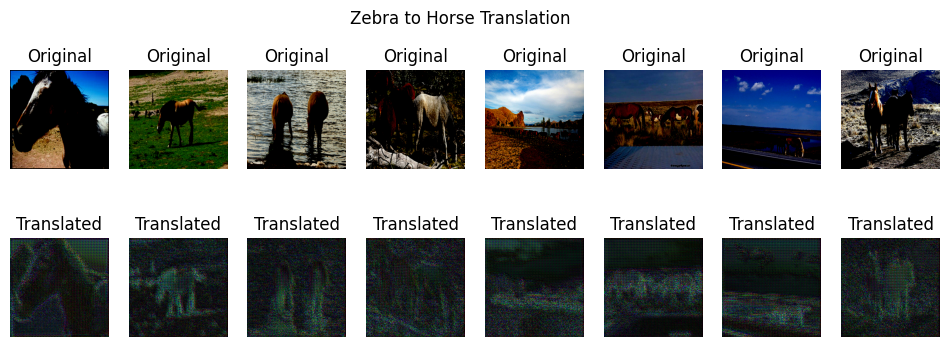

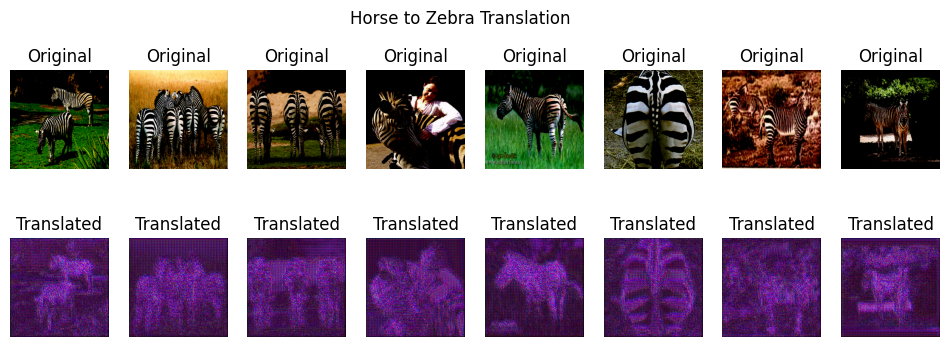

Epoch [0/1], Batch [100/167], G Loss: 1.4533, D_A Loss: 0.2504, D_B Loss: 0.2685, Cycle A Loss: 0.2078, Cycle B Loss: 0.2716


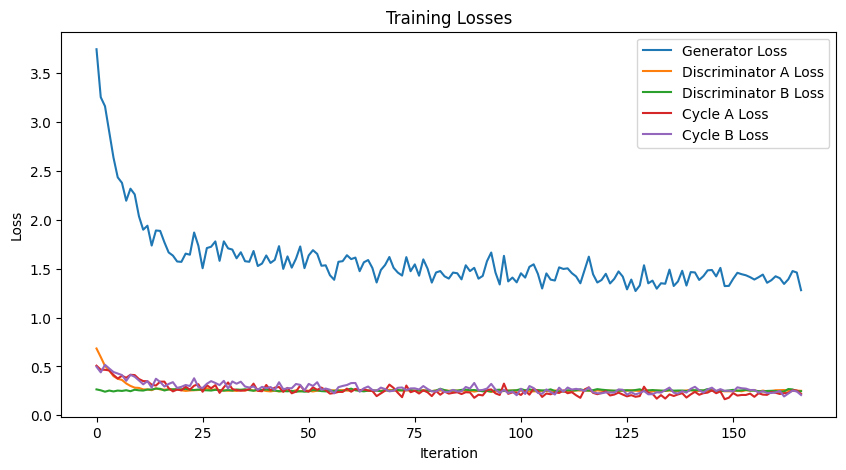

In [ ]:
# Train the CycleGAN model
train_cycle_gan(train_dataloader, num_epochs=1, lr=0.0002)

#Part 2

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image
import itertools
import os
import numpy as np
from skimage.metrics import structural_similarity as ssim

# Define the training loop with support for multimodal translation
def train_cycle_gan_multimodal(dataset, num_epochs=2, lr=0.0002, save_interval=5, save_dir='saved_models', num_outputs=5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize the generators
    generator_AB = Generator(input_channels=3, output_channels=3).to(device)
    generator_BA = Generator(input_channels=3, output_channels=3).to(device)

    # Initialize the discriminators
    discriminator_A = Discriminator(input_channels=3).to(device)
    discriminator_B = Discriminator(input_channels=3).to(device)

    # Initialize the optimizers
    optimizer_G = optim.Adam(itertools.chain(generator_AB.parameters(), generator_BA.parameters()), lr=lr, betas=(0.5, 0.999))
    optimizer_D_A = optim.Adam(discriminator_A.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D_B = optim.Adam(discriminator_B.parameters(), lr=lr, betas=(0.5, 0.999))

    # Define loss functions (adversarial, cycle consistency, and diversity)
    criterion_GAN = nn.MSELoss()
    criterion_cycle = nn.L1Loss()
    criterion_diversity = nn.L1Loss()  # Diversity loss

    for epoch in range(num_epochs):
        for batch_idx, (zebra_images, horse_images) in enumerate(dataset):
            zebra_images = zebra_images.to(device)
            horse_images = horse_images.to(device)

            # Adversarial ground truth
            bs = zebra_images.shape[0]
            valid = torch.ones(bs, 1, device=device)
            fake = torch.zeros(bs, 1, device=device)

            # Generate multiple outputs for each input
            outputs = []
            for _ in range(num_outputs):
                # Generate translated images using the generators
                fake_B = generator_AB(zebra_images)
                fake_A = generator_BA(horse_images)
                outputs.append((fake_B, fake_A))

            # Train the generators
            optimizer_G.zero_grad()

            # Identity loss
            same_B = generator_AB(horse_images)
            loss_identity_B = criterion_cycle(same_B, horse_images)

            same_A = generator_BA(zebra_images)
            loss_identity_A = criterion_cycle(same_A, zebra_images)

            # GAN loss
            loss_GAN_AB = 0
            loss_GAN_BA = 0
            for fake_B, fake_A in outputs:
                pred_fake_B = discriminator_B(fake_B)
                loss_GAN_AB += criterion_GAN(pred_fake_B, valid)

                pred_fake_A = discriminator_A(fake_A)
                loss_GAN_BA += criterion_GAN(pred_fake_A, valid)

            loss_GAN_AB /= num_outputs
            loss_GAN_BA /= num_outputs

            # Cycle loss
            loss_cycle_A = 0
            loss_cycle_B = 0
            for fake_B, fake_A in outputs:
                recovered_A = generator_BA(fake_B)
                loss_cycle_A += criterion_cycle(recovered_A, zebra_images)

                recovered_B = generator_AB(fake_A)
                loss_cycle_B += criterion_cycle(recovered_B, horse_images)

            loss_cycle_A /= num_outputs
            loss_cycle_B /= num_outputs

            # Diversity loss
            loss_diversity_A = 0
            loss_diversity_B = 0
            for i in range(num_outputs):
                for j in range(i + 1, num_outputs):
                    loss_diversity_A += criterion_diversity(outputs[i][1], outputs[j][1])
                    loss_diversity_B += criterion_diversity(outputs[i][0], outputs[j][0])

            loss_diversity_A /= (num_outputs * (num_outputs - 1) / 2)
            loss_diversity_B /= (num_outputs * (num_outputs - 1) / 2)

            # Total loss
            loss_G = loss_identity_A + loss_identity_B + loss_GAN_AB + loss_GAN_BA + loss_cycle_A + loss_cycle_B + loss_diversity_A + loss_diversity_B

            loss_G.backward()
            optimizer_G.step()

            # Train the discriminators
            optimizer_D_A.zero_grad()

            loss_real_A = 0
            loss_fake_A = 0
            for fake_B, fake_A in outputs:
                pred_real_A = discriminator_A(horse_images)
                loss_real_A += criterion_GAN(pred_real_A, valid)

                pred_fake_A = discriminator_A(fake_A.detach())
                loss_fake_A += criterion_GAN(pred_fake_A, fake)

            loss_real_A /= num_outputs
            loss_fake_A /= num_outputs

            loss_D_A = 0.5 * (loss_real_A + loss_fake_A)

            loss_D_A.backward()
            optimizer_D_A.step()

            optimizer_D_B.zero_grad()

            loss_real_B = 0
            loss_fake_B = 0
            for fake_B, fake_A in outputs:
                pred_real_B = discriminator_B(zebra_images)
                loss_real_B += criterion_GAN(pred_real_B, valid)

                pred_fake_B = discriminator_B(fake_B.detach())
                loss_fake_B += criterion_GAN(pred_fake_B, fake)

            loss_real_B /= num_outputs
            loss_fake_B /= num_outputs

            loss_D_B = 0.5 * (loss_real_B + loss_fake_B)

            loss_D_B.backward()
            optimizer_D_B.step()

            # Print losses
            print(f'Epoch [{epoch}/{num_epochs}], Batch [{batch_idx}/{len(dataset)}]')
            print(f'    GAN Loss AB: {loss_GAN_AB.item()}, GAN Loss BA: {loss_GAN_BA.item()}')
            print(f'    Cycle Loss A: {loss_cycle_A.item()}, Cycle Loss B: {loss_cycle_B.item()}')
            print(f'    Identity Loss A: {loss_identity_A.item()}, Identity Loss B: {loss_identity_B.item()}')
            print(f'    Diversity Loss A: {loss_diversity_A.item()}, Diversity Loss B: {loss_diversity_B.item()}')
            print(f'    Discriminator Loss A: {loss_D_A.item()}, Discriminator Loss B: {loss_D_B.item()}')

            # Save generated images
            if batch_idx % save_interval == 0:
                output_dir = os.path.join(save_dir, f'epoch_{epoch}_batch_{batch_idx}')
                os.makedirs(output_dir, exist_ok=True)
                for i, (fake_B, fake_A) in enumerate(outputs):
                    save_image(fake_B, os.path.join(output_dir, f'fake_B_output_{i}.png'), normalize=True)
                    save_image(fake_A, os.path.join(output_dir, f'fake_A_output_{i}.png'), normalize=True)

        # Save models every few epochs
        if epoch % save_interval == 0:
            os.makedirs(save_dir, exist_ok=True)
            torch.save(generator_AB.state_dict(), os.path.join(save_dir, f'generator_AB_epoch_{epoch}.pt'))
            torch.save(generator_BA.state_dict(), os.path.join(save_dir, f'generator_BA_epoch_{epoch}.pt'))
            torch.save(discriminator_A.state_dict(), os.path.join(save_dir, f'discriminator_A_epoch_{epoch}.pt'))
            torch.save(discriminator_B.state_dict(), os.path.join(save_dir, f'discriminator_B_epoch_{epoch}.pt'))

    # Evaluate the generated samples after training
    mean_ssim, mean_diversity = evaluate_generated_samples(generator_AB, test_dataloader, num_outputs=5, output_dir='evaluation_results')

    print(f'Mean SSIM: {mean_ssim}')
    print(f'Mean Diversity: {mean_diversity}')

# Define the number of outputs to generate for each input
num_outputs = 5

In [ ]:
from skimage.metrics import structural_similarity as ssim

# Evaluation code
def evaluate_generated_samples(generator, dataloader, num_outputs, output_dir):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    generator.eval()

    ssim_scores = []
    diversity_scores = []

    with torch.no_grad():
        for batch_idx, (zebra_images, horse_images) in enumerate(dataloader):
            zebra_images = zebra_images.to(device)
            horse_images = horse_images.to(device)

            # Generate multiple outputs for each input
            outputs = []
            for _ in range(num_outputs):
                fake_B = generator(zebra_images)
                outputs.append(fake_B)

            # Compute SSIM score
            for fake_B in outputs:
                fake_B_cpu = fake_B.cpu().detach().numpy().transpose(0, 2, 3, 1)
                horse_images_cpu = horse_images.cpu().numpy().transpose(0, 2, 3, 1)
                im_shape = fake_B_cpu.shape[1:3]
                win_size = min(im_shape) // 7 * 2 + 1  # Ensure odd value
                ssim_score = np.mean([ssim(im_fake, im_real, win_size=win_size, multichannel=True) for im_fake, im_real in zip(fake_B_cpu, horse_images_cpu)])
                ssim_scores.append(ssim_score)

            # Compute diversity score
            for i in range(num_outputs):
                for j in range(i + 1, num_outputs):
                    diversity_score = torch.mean(torch.abs(outputs[i] - outputs[j])).item()
                    diversity_scores.append(diversity_score)

    mean_ssim = np.mean(ssim_scores)
    mean_diversity = np.mean(diversity_scores)

    # Save evaluation results
    os.makedirs(output_dir, exist_ok=True)
    with open(os.path.join(output_dir, 'evaluation_results.txt'), 'w') as f:
        f.write(f'Mean SSIM: {mean_ssim}\n')
        f.write(f'Mean Diversity: {mean_diversity}\n')

    return mean_ssim, mean_diversity

In [ ]:


# Train the CycleGAN model with multimodal translation
train_cycle_gan_multimodal(train_dataloader, num_epochs=1, lr=0.0002)



Epoch [0/1], Batch [0/167]
    GAN Loss AB: 0.9134331941604614, GAN Loss BA: 0.6991221904754639
    Cycle Loss A: 0.47495612502098083, Cycle Loss B: 0.5032546520233154
    Identity Loss A: 0.4824810028076172, Identity Loss B: 0.4919821619987488
    Diversity Loss A: 6.539737995581163e-08, Diversity Loss B: 5.665026492351899e-08
    Discriminator Loss A: 0.3728589415550232, Discriminator Loss B: 0.47302040457725525
Epoch [0/1], Batch [1/167]
    GAN Loss AB: 0.7514324188232422, GAN Loss BA: 0.5923351645469666
    Cycle Loss A: 0.4578016698360443, Cycle Loss B: 0.464397668838501
    Identity Loss A: 0.47227972745895386, Identity Loss B: 0.4580090045928955
    Diversity Loss A: 6.486227732693806e-08, Diversity Loss B: 6.11334414202247e-08
    Discriminator Loss A: 0.31469690799713135, Discriminator Loss B: 0.3984399139881134
Epoch [0/1], Batch [2/167]
    GAN Loss AB: 0.6307798624038696, GAN Loss BA: 0.475874662399292
    Cycle Loss A: 0.48019859194755554, Cycle Loss B: 0.4754036366939544

<ipython-input-25-98181b7f6837>:29: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_score = np.mean([ssim(im_fake, im_real, win_size=win_size, multichannel=True) for im_fake, im_real in zip(fake_B_cpu, horse_images_cpu)])


Mean SSIM: 0.007394996006041765
Mean Diversity: 5.301623503663046e-08


Part 3: Consistency Regularization

Cycle Consistency Regularization:

    In CycleGAN, the generator aims to learn mappings G:A→BG:A→B and F:B→AF:B→A between two domains AA and BB.
    Cycle consistency regularization enforces that if an image xx from domain AA is translated to domain BB and then translated back to domain AA, it should ideally be close to the original image xx.
    Mathematically, for a pair of images xx and yy, cycle consistency is achieved by minimizing the reconstruction loss:
    Lcycle(G,F)=Ex∼pdata(x)[∥F(G(x))−x∥1]+Ey∼pdata(y)[∥G(F(y))−y∥1]
    Lcycle​(G,F)=Ex∼pdata​(x)​[∥F(G(x))−x∥1​]+Ey∼pdata​(y)​[∥G(F(y))−y∥1​]
    Here, GG and FF are the generators, pdata(x)pdata​(x) and pdata(y)pdata​(y) represent the distributions of images from domains AA and BB, and ∥⋅∥1∥⋅∥1​ denotes the L1L1 norm.

In [ ]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image

class CustomDataset(Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.image_files = os.listdir(data_path)
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_path, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define paths to the dataset folders
train_data_path_A = '/content/horse2zebra_dataset/trainA'
train_data_path_B = '/content/horse2zebra_dataset/trainB'
test_data_path_A = '/content/horse2zebra_dataset/testA'
test_data_path_B = '/content/horse2zebra_dataset/testB'

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

# Load the training dataset
train_dataset_A = CustomDataset(data_path=train_data_path_A, transform=transform)
train_dataset_B = CustomDataset(data_path=train_data_path_B, transform=transform)
train_loader_A = torch.utils.data.DataLoader(train_dataset_A, batch_size=64, shuffle=True)
train_loader_B = torch.utils.data.DataLoader(train_dataset_B, batch_size=64, shuffle=True)

# Load the testing dataset
test_dataset_A = CustomDataset(data_path=test_data_path_A, transform=transform)
test_dataset_B = CustomDataset(data_path=test_data_path_B, transform=transform)
test_loader_A = torch.utils.data.DataLoader(test_dataset_A, batch_size=64, shuffle=False)
test_loader_B = torch.utils.data.DataLoader(test_dataset_B, batch_size=64, shuffle=False)

# Display the number of images in each dataset
print(f"Number of training images in domain A: {len(train_dataset_A)}")
print(f"Number of training images in domain B: {len(train_dataset_B)}")
print(f"Number of testing images in domain A: {len(test_dataset_A)}")
print(f"Number of testing images in domain B: {len(test_dataset_B)}")
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Function to display a grid of images
def show_images(images):
    # Create a grid of images
    grid = make_grid(images, nrow=8, padding=2, normalize=True)
    # Convert tensor to numpy array
    grid = grid.permute(1, 2, 0).numpy()
    # Display the grid of images
    plt.figure(figsize=(20, 10))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()



Number of training images in domain A: 1067
Number of training images in domain B: 1334
Number of testing images in domain A: 120
Number of testing images in domain B: 140


In [ ]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
import random

class CustomDataset(Dataset):
    def __init__(self, data_path, num_images=5, transform=None):
        self.data_path = data_path
        self.image_files = os.listdir(data_path)[:num_images]  # Select a subset of images
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.data_path, self.image_files[idx])
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Define paths to the dataset folders
train_data_path_A = '/content/horse2zebra_dataset/trainA'
train_data_path_B = '/content/horse2zebra_dataset/trainB'
test_data_path_A = '/content/horse2zebra_dataset/testA'
test_data_path_B = '/content/horse2zebra_dataset/testB'

# Define transformations to apply to the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize pixel values
])

# Load a small subset of the training dataset
num_images = 5  # Number of images to use for training
train_dataset_A = CustomDataset(data_path=train_data_path_A, num_images=num_images, transform=transform)
train_dataset_B = CustomDataset(data_path=train_data_path_B, num_images=num_images, transform=transform)
train_loader_A = torch.utils.data.DataLoader(train_dataset_A, batch_size=1, shuffle=True)
train_loader_B = torch.utils.data.DataLoader(train_dataset_B, batch_size=1, shuffle=True)


In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Generator architecture
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )

        # Residual Blocks
        self.residual_blocks = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        # Encoder
        encoded = self.encoder(x)

        # Residual Blocks
        residual = self.residual_blocks(encoded)

        # Decoder
        decoded = self.decoder(residual + encoded)

        return decoded

# Discriminator architecture
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=1)
        )

    def forward(self, x):
        return self.model(x)


# Load the testing dataset
test_dataset_A = CustomDataset(data_path=test_data_path_A,  num_images=num_images,transform=transform)
test_dataset_B = CustomDataset(data_path=test_data_path_B, num_images=num_images, transform=transform)
test_loader_A = DataLoader(test_dataset_A, batch_size=64, shuffle=False)
test_loader_B = DataLoader(test_dataset_B, batch_size=64, shuffle=False)

# Display the number of images in each dataset
print(f"Number of training images in domain A: {len(train_dataset_A)}")
print(f"Number of training images in domain B: {len(train_dataset_B)}")
print(f"Number of testing images in domain A: {len(test_dataset_A)}")
print(f"Number of testing images in domain B: {len(test_dataset_B)}")

# Function to display a grid of images
def show_images(images):
    # Create a grid of images
    grid = make_grid(images, nrow=8, padding=2, normalize=True)
    # Convert tensor to numpy array
    grid = grid.permute(1, 2, 0).numpy()
    # Display the grid of images
    plt.figure(figsize=(20, 10))
    plt.imshow(grid)
    plt.axis('off')
    plt.show()




Number of training images in domain A: 5
Number of training images in domain B: 5
Number of testing images in domain A: 5
Number of testing images in domain B: 5


In [ ]:
import itertools

In [ ]:
# Define loss functions
criterion_adversarial = nn.BCELoss()
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()

lambda_cycle = 10.0
log_interval = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

lambda_adversarial = 1.0

In [ ]:
import torch.optim as optim

# Initialize the generators and discriminators
G_A = Generator()
G_B = Generator()
D_A = Discriminator()
D_B = Discriminator()

# Define the optimizers for the generators and discriminators
optimizer_G = optim.Adam(list(G_A.parameters()) + list(G_B.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(list(D_A.parameters()) + list(D_B.parameters()), lr=0.0002, betas=(0.5, 0.999))

# Define the loss functions
criterion_GAN = nn.MSELoss()  # Use Mean Squared Error loss for GAN loss
criterion_cycle = nn.L1Loss()  # Use L1 loss for cycle consistency regularization

# Training loop
num_epochs = 2  # Set the number of epochs
for epoch in range(num_epochs):
    for i, (real_A, real_B) in enumerate(zip(train_loader_A, train_loader_B)):
        # Set model input
        real_A = real_A.to(device)
        real_B = real_B.to(device)

        ######################
        #  Train Generators  #
        ######################

        optimizer_G.zero_grad()

        # GAN loss
        G_A = G_A.to(device)
        fake_B = G_A(real_A)
        D_B = D_B.to(device)
        pred_fake = D_B(fake_B)
        loss_GAN_AB = criterion_GAN(pred_fake, torch.ones_like(pred_fake))
        G_B=G_B.to(device)
        fake_A = G_B(real_B)
        D_A=D_A.to(device)
        pred_fake = D_A(fake_A)
        loss_GAN_BA = criterion_GAN(pred_fake, torch.ones_like(pred_fake))

        # Cycle consistency loss
        reconstructed_A = G_B(fake_B)
        loss_cycle_A = criterion_cycle(reconstructed_A, real_A)

        reconstructed_B = G_A(fake_A)
        loss_cycle_B = criterion_cycle(reconstructed_B, real_B)

        # Total generator loss with cycle consistency regularization
        loss_G = loss_GAN_AB + loss_GAN_BA + lambda_cycle * (loss_cycle_A + loss_cycle_B)

        loss_G.backward()
        optimizer_G.step()

        ######################
        #  Train Discriminators  #
        ######################

        optimizer_D.zero_grad()

        # Discriminator loss for domain A
        pred_real = D_A(real_A)
        loss_D_real_A = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_A = G_B(real_B)
        pred_fake = D_A(fake_A.detach())
        loss_D_fake_A = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_A = (loss_D_real_A + loss_D_fake_A) * 0.5

        # Discriminator loss for domain B
        pred_real = D_B(real_B)
        loss_D_real_B = criterion_GAN(pred_real, torch.ones_like(pred_real))
        fake_B = G_A(real_A)
        pred_fake = D_B(fake_B.detach())
        loss_D_fake_B = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))
        loss_D_B = (loss_D_real_B + loss_D_fake_B) * 0.5

        # Total discriminator loss
        loss_D = loss_D_A + loss_D_B

        loss_D.backward()
        optimizer_D.step()

        # Print losses
        if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch {i}, "
                f"Loss G: {loss_G.item()}, Loss D: {loss_D.item()}"
            )

    # Save models
    if (epoch + 1) % 5 == 0:
        torch.save(G_A.state_dict(), f"G_A_epoch{epoch+1}.pt")
        torch.save(G_B.state_dict(), f"G_B_epoch{epoch+1}.pt")
        torch.save(D_A.state_dict(), f"D_A_epoch{epoch+1}.pt")
        torch.save(D_B.state_dict(), f"D_B_epoch{epoch+1}.pt")


Epoch [0/2], Batch 0, Loss G: 17.735435485839844, Loss D: 2.1361804008483887
Epoch [1/2], Batch 0, Loss G: 12.452104568481445, Loss D: 0.6318012475967407


Epoch [0/2], Batch 0, Loss G: 8.07749080657959, Loss D: 0.5971943140029907


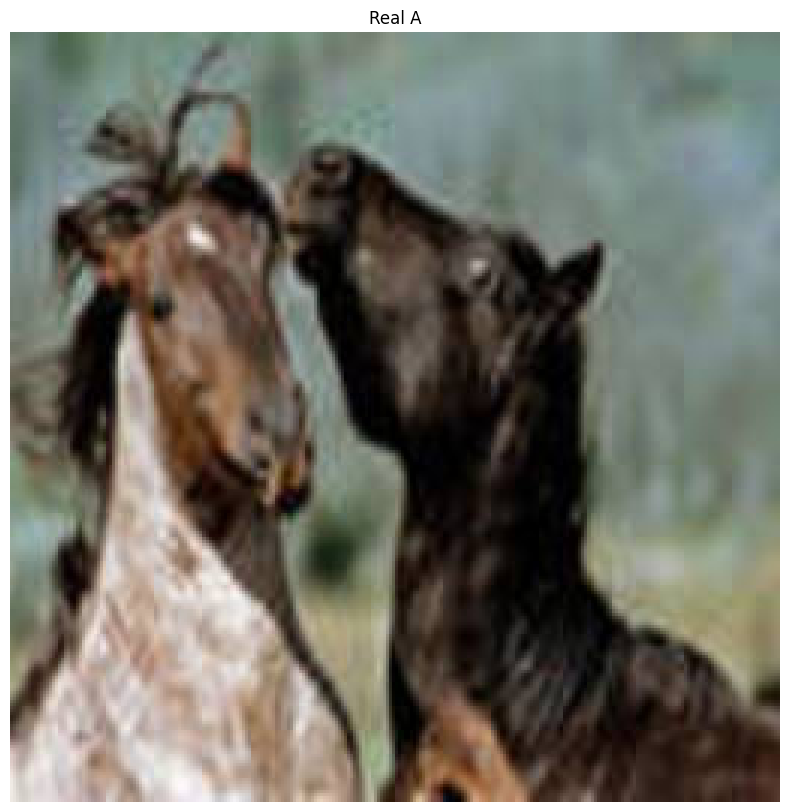

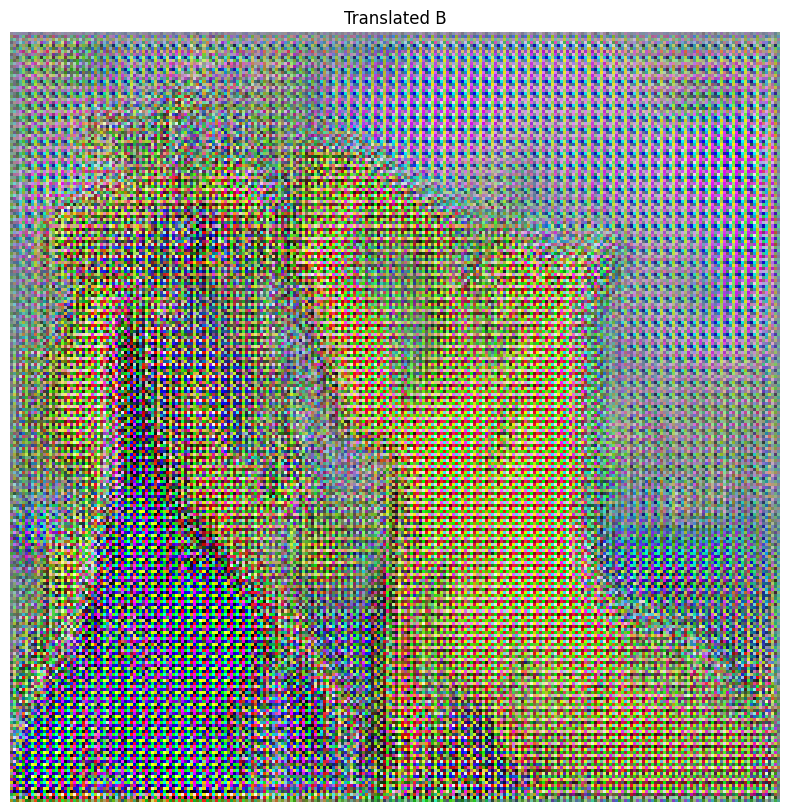

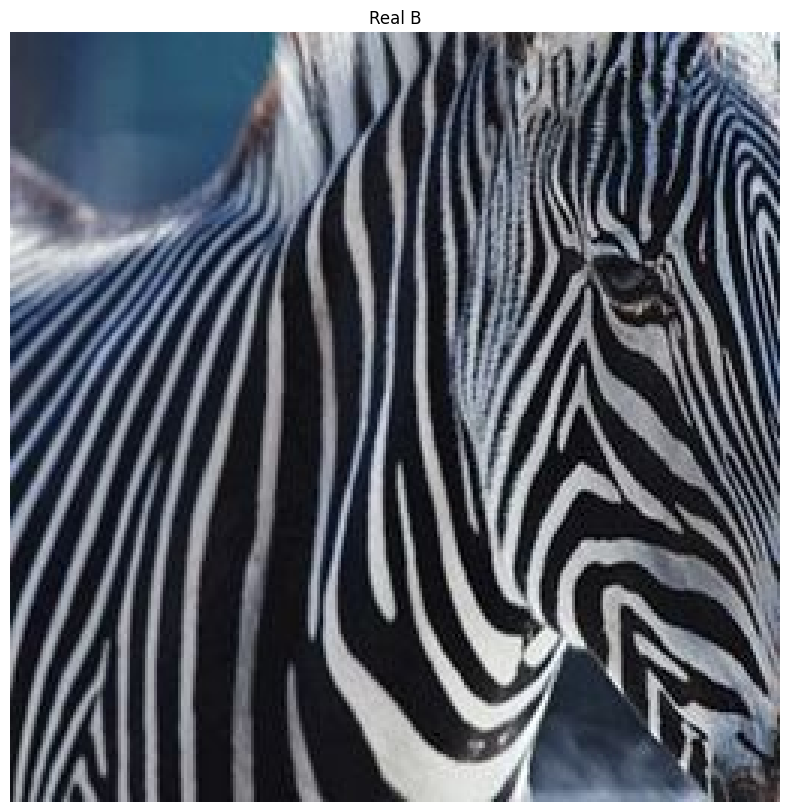

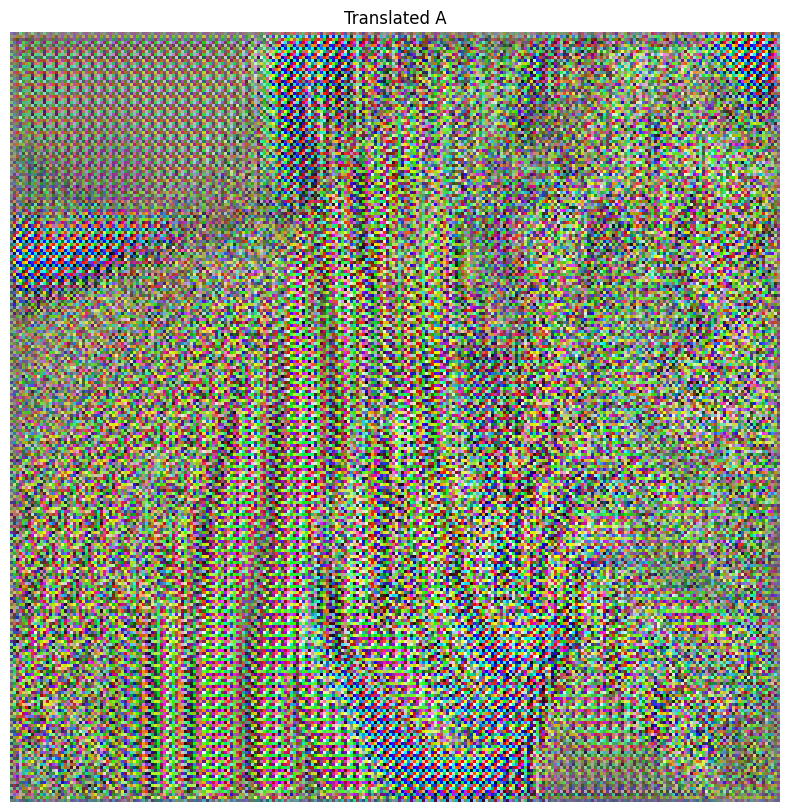

Epoch [1/2], Batch 0, Loss G: 8.07749080657959, Loss D: 0.5971943140029907


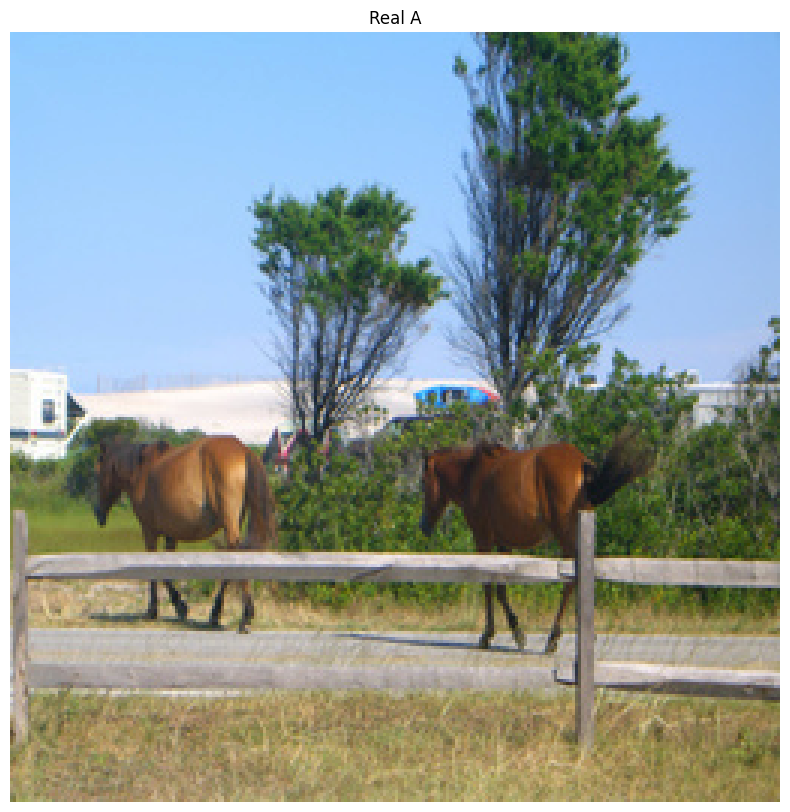

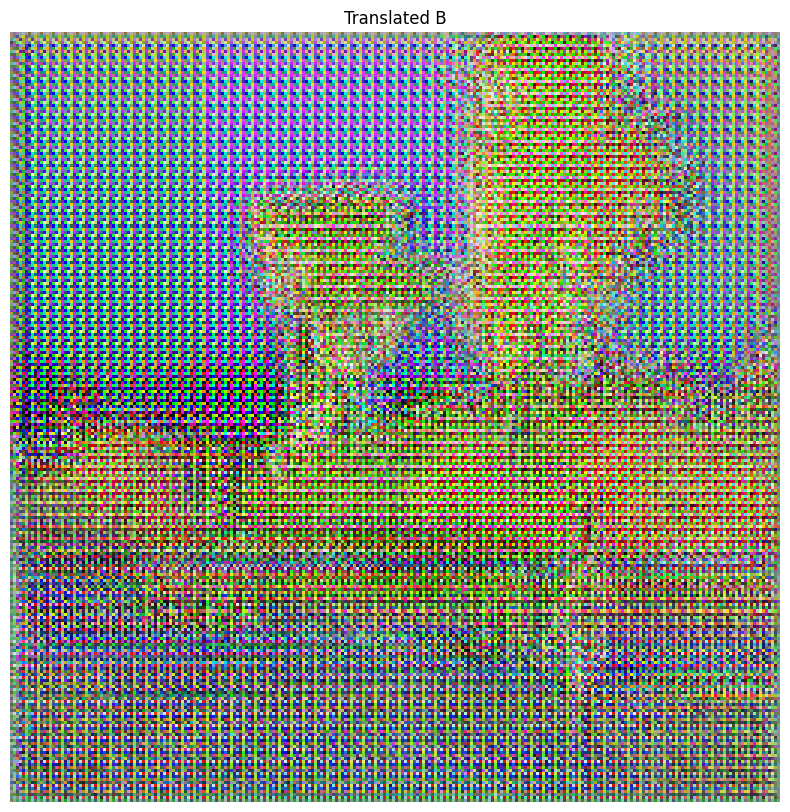

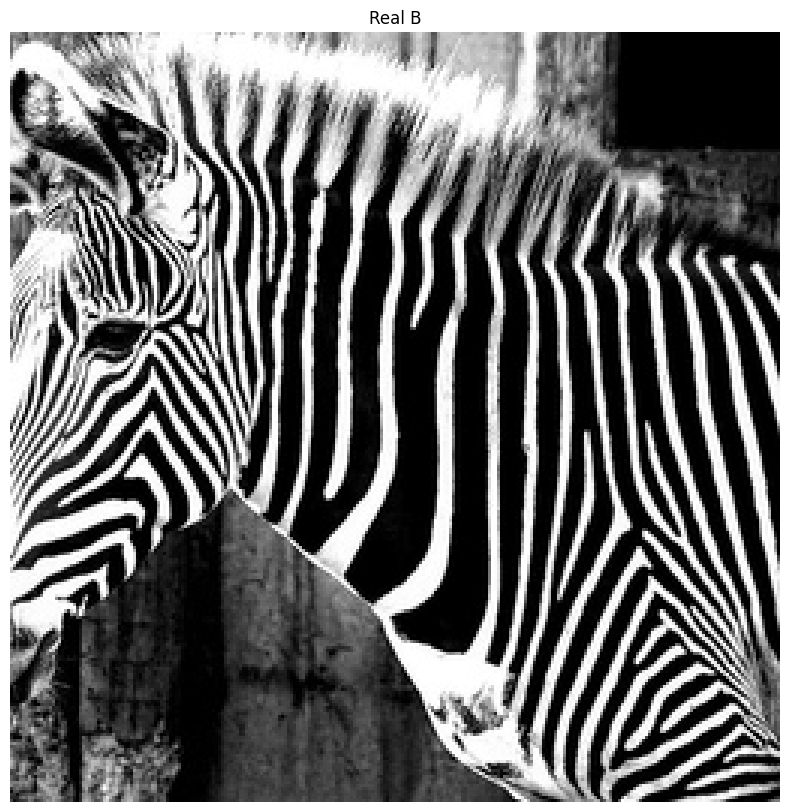

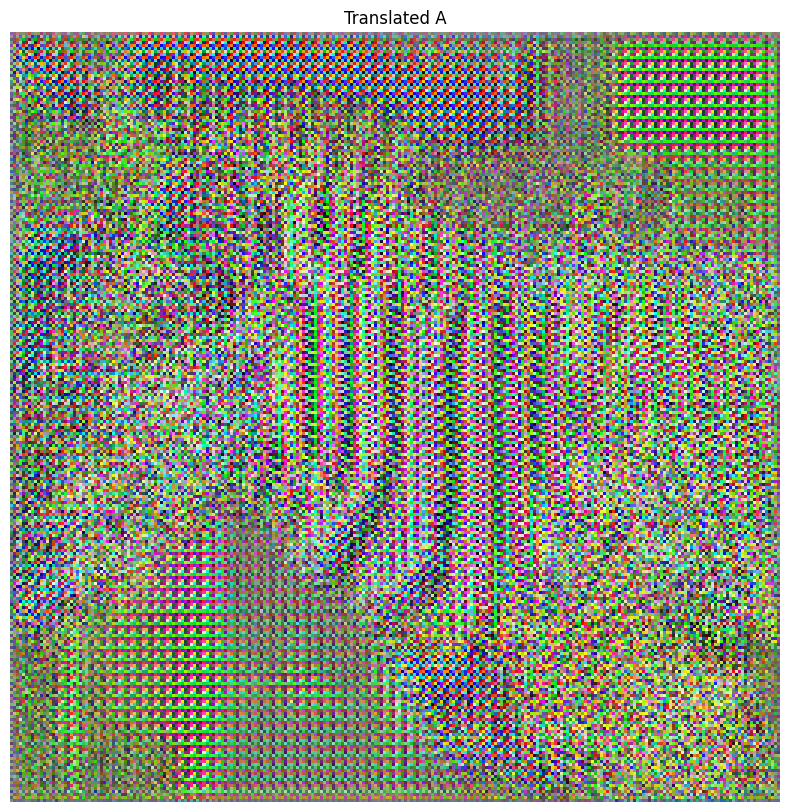

Epoch [2/2], Batch 0, Loss G: 8.07749080657959, Loss D: 0.5971943140029907


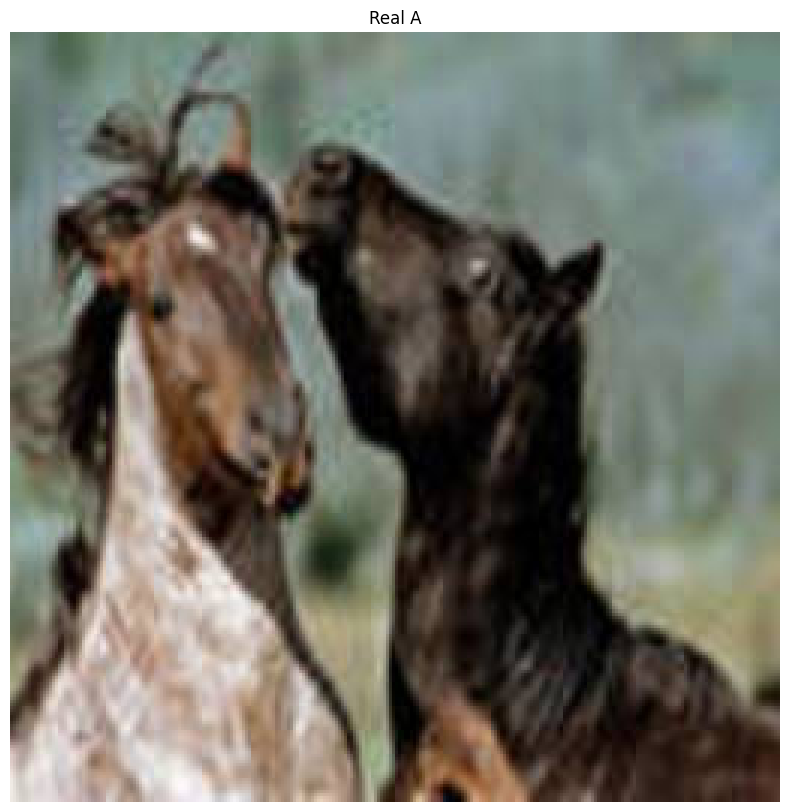

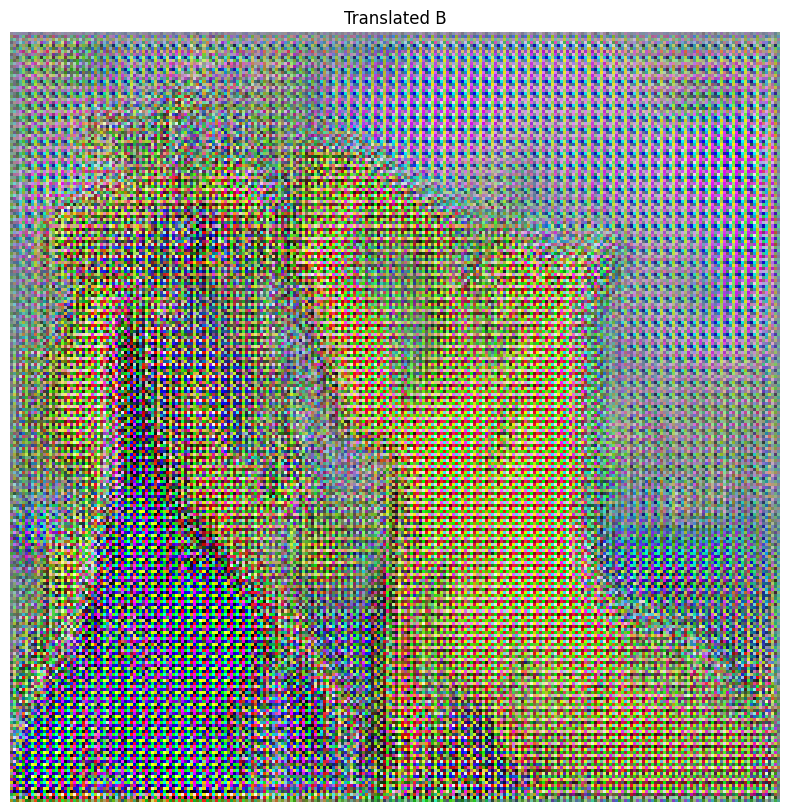

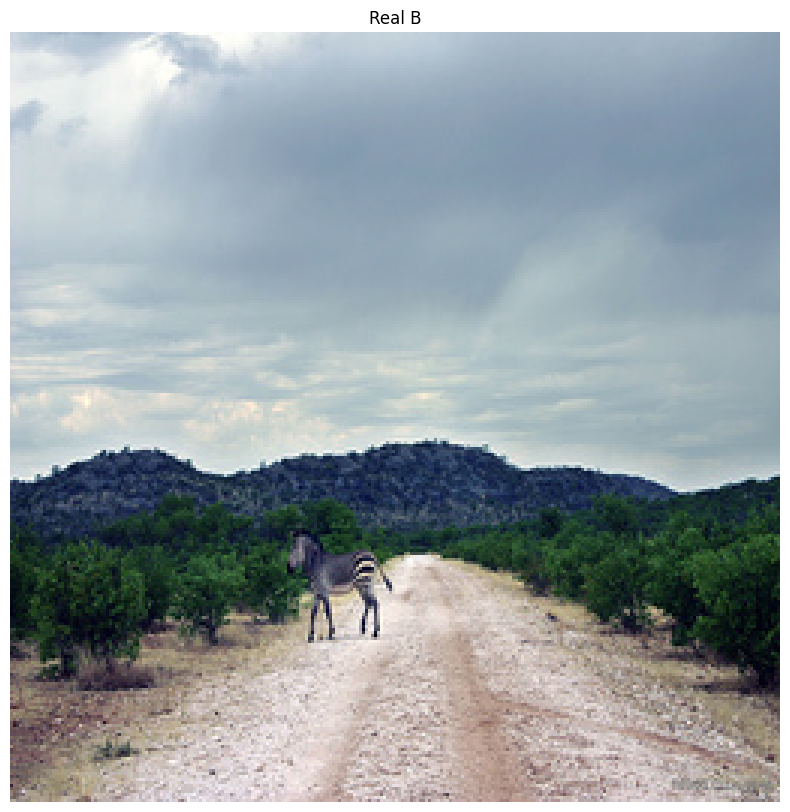

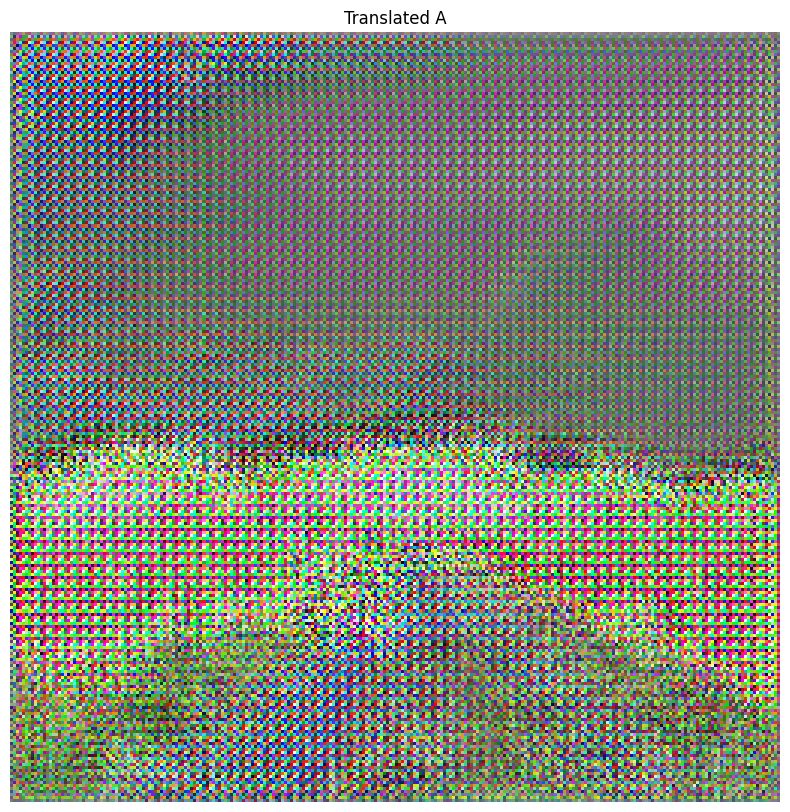

Epoch [3/2], Batch 0, Loss G: 8.07749080657959, Loss D: 0.5971943140029907


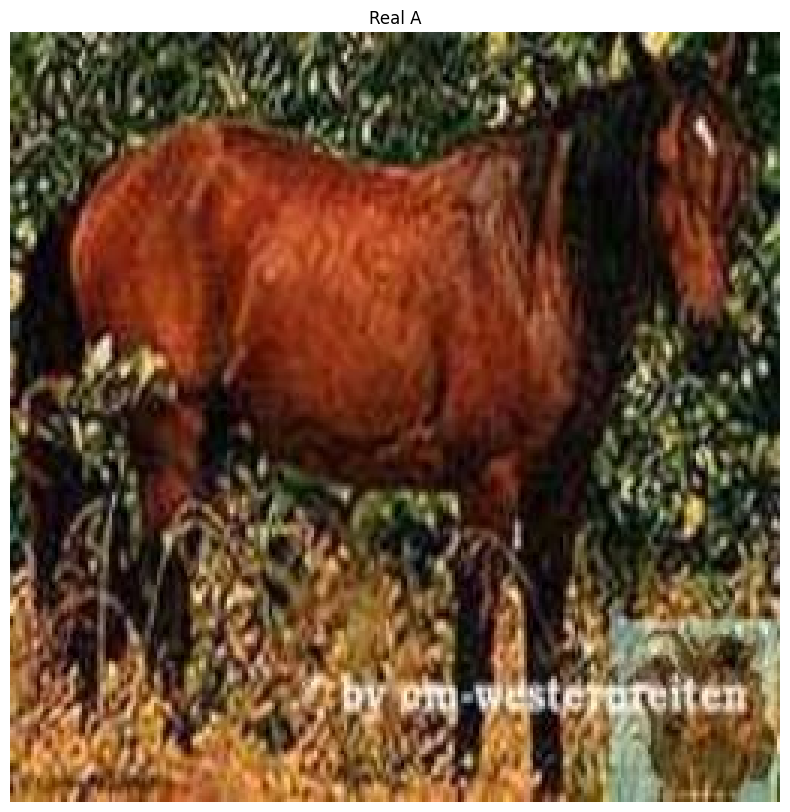

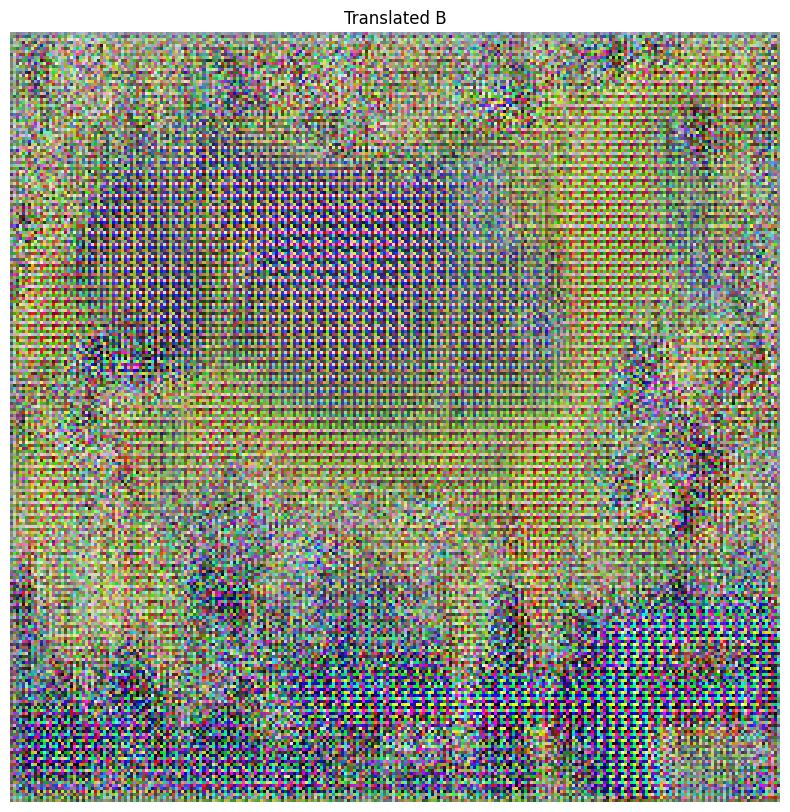

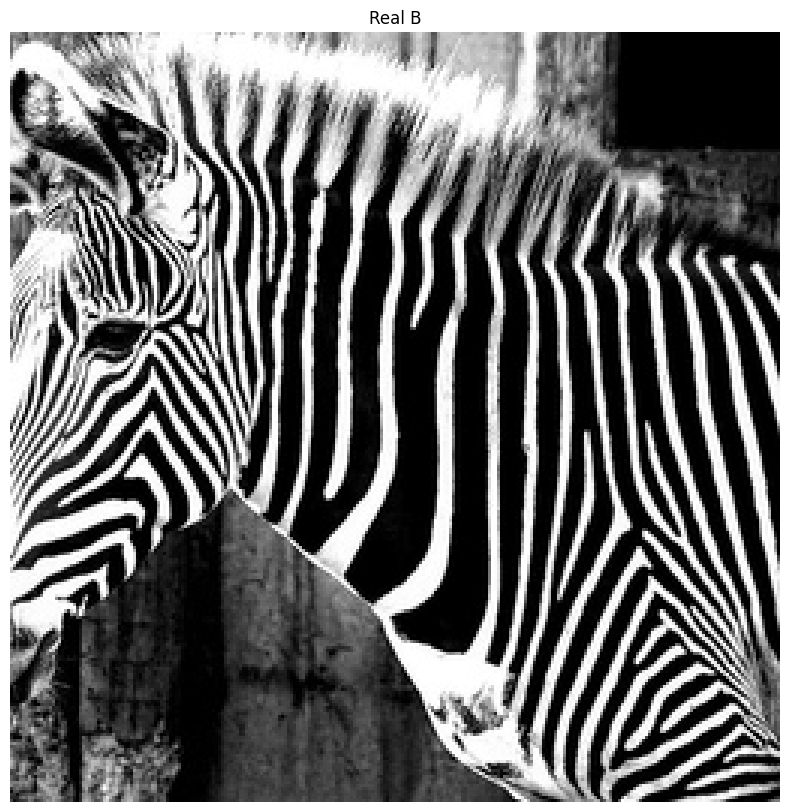

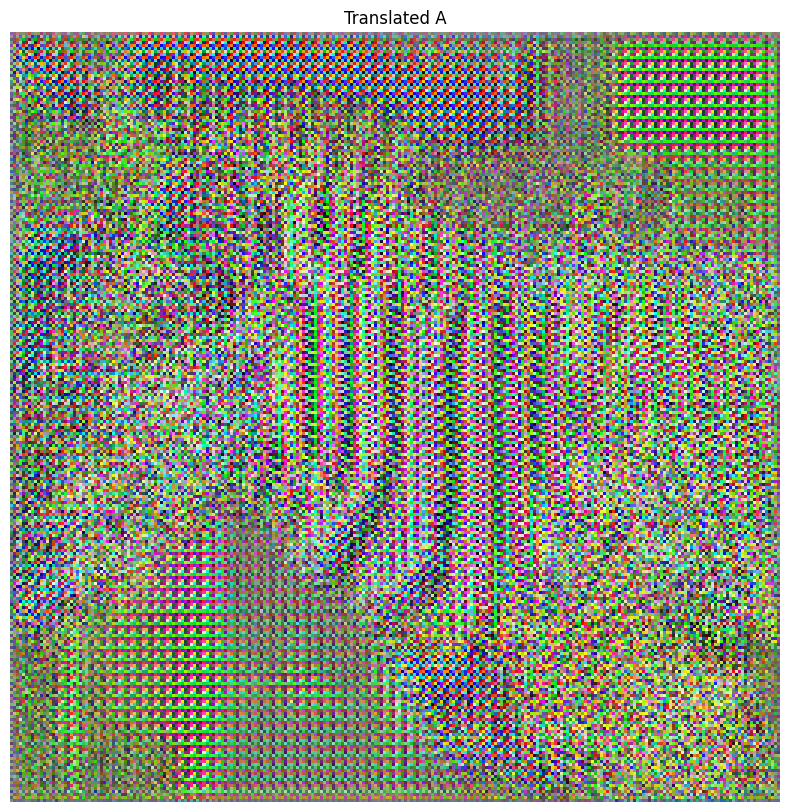

Epoch [4/2], Batch 0, Loss G: 8.07749080657959, Loss D: 0.5971943140029907


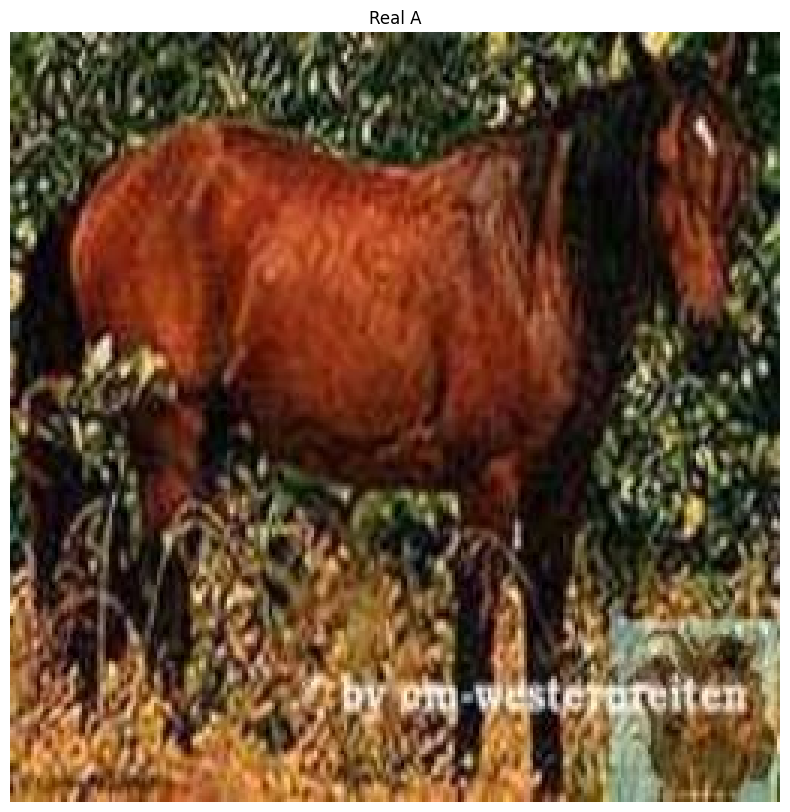

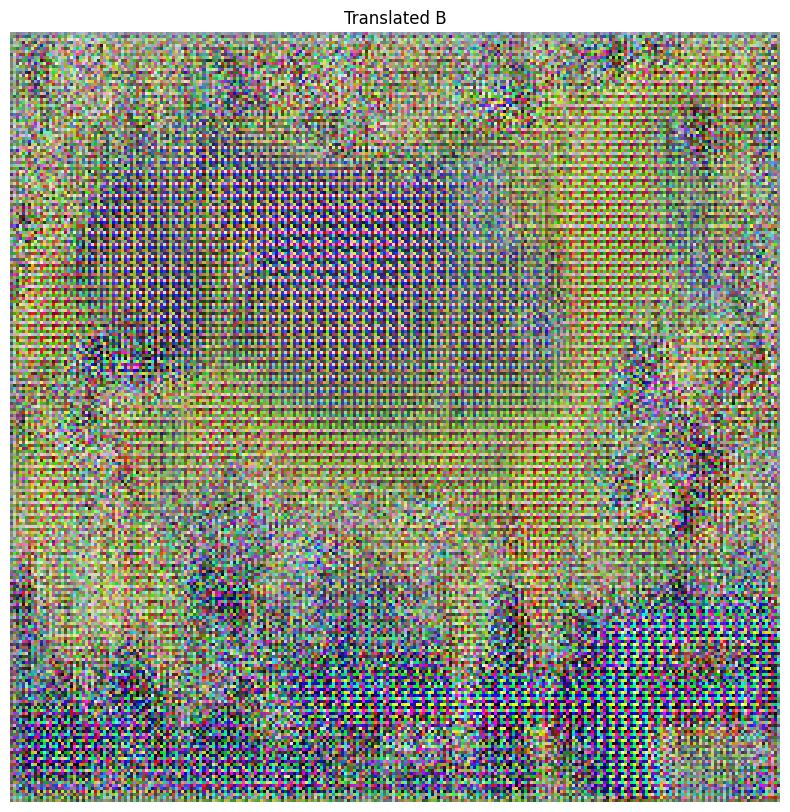

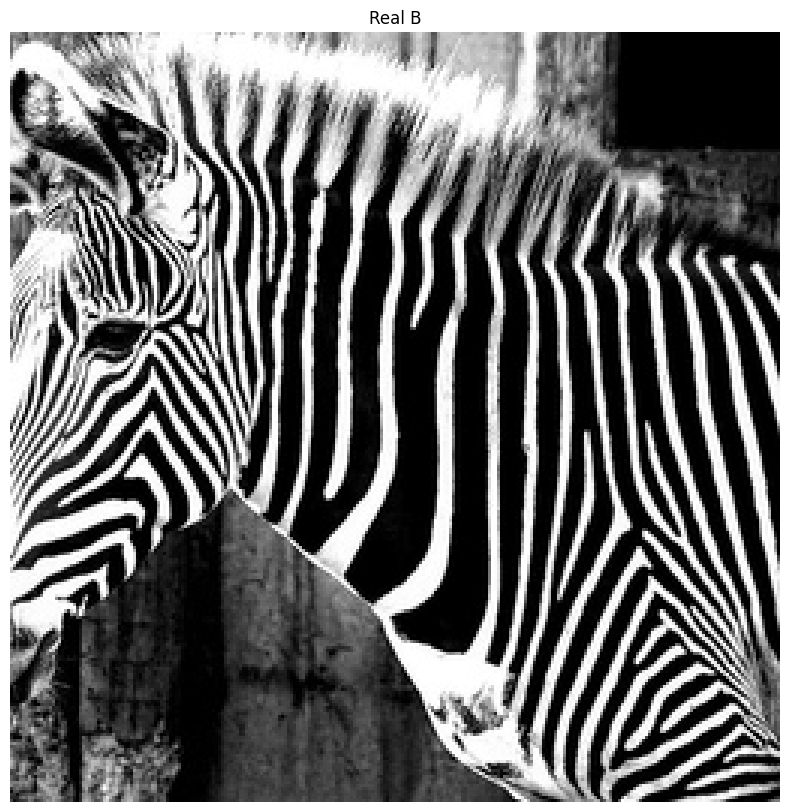

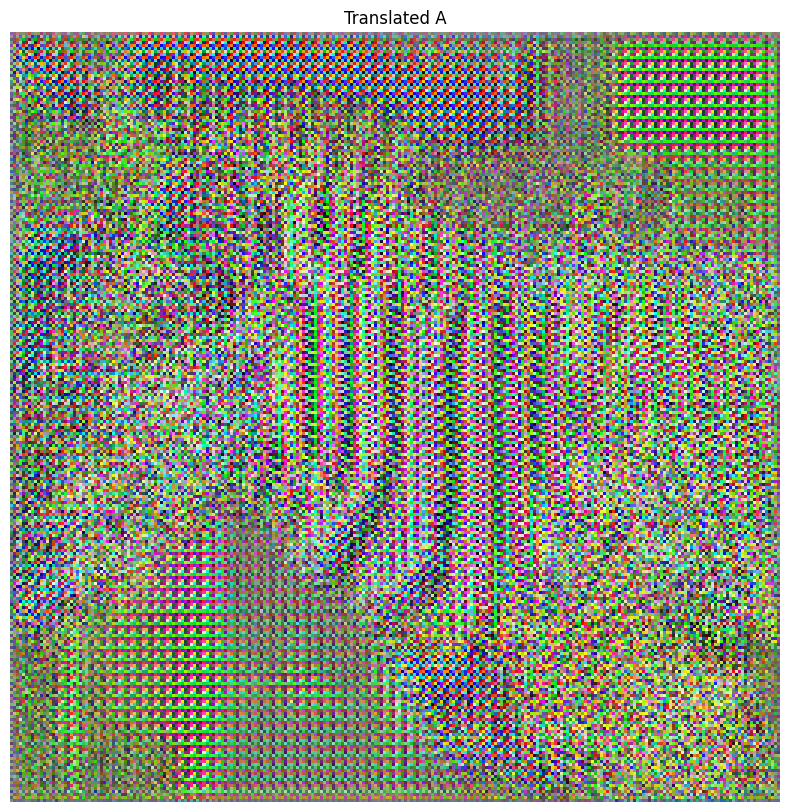

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Function to display a batch of images
def show_images_grid(images, title):
    plt.figure(figsize=(10, 10))
    plt.title(title)
    plt.axis("off")
    plt.imshow(
        vutils.make_grid(images.detach().cpu(), padding=2, normalize=True).permute(1, 2, 0)
    )
    plt.show()

# Training loop
for epoch in range(5):
    for i, (real_A, real_B) in enumerate(zip(train_loader_A, train_loader_B)):
        # Your existing training code here

        # Print losses
        if i % 100 == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}], Batch {i}, "
                f"Loss G: {loss_G.item()}, Loss D: {loss_D.item()}"
            )

        # Visualize generated images
        if i % 500 == 0:
            with torch.no_grad():
                # Generate translated images
                fake_B = G_A(real_A)
                fake_A = G_B(real_B)

                # Display original and translated images
                show_images_grid(real_A, title="Real A")
                show_images_grid(fake_B, title="Translated B")
                show_images_grid(real_B, title="Real B")
                show_images_grid(fake_A, title="Translated A")



Consistency regularization, also known as cycle consistency loss, plays a crucial role in the convergence behavior and generalization performance of CycleGAN models. Here's an analysis of its impact:

Convergence Behavior:

Cycle consistency loss ensures that the generated images from one domain can be reconstructed back to the original domain. This constraint encourages the generators to learn meaningful mappings between domains.
Without consistency regularization, the model may suffer from mode collapse, where the generator learns to map all input images to a limited set of output images. This can lead to poor convergence behavior, where the model fails to capture the full diversity of the target domain.
By enforcing cycle consistency, the model is incentivized to maintain diversity in the generated images, which helps in better convergence behavior. It prevents the generators from collapsing to a single mode and encourages them to capture multiple modes in the target domain.
Generalization Performance:

Consistency regularization acts as a form of regularization during training, preventing overfitting to the training data.
It encourages the model to learn a more generalized mapping between domains, rather than simply memorizing the training examples. This leads to better generalization performance on unseen data.
Without cycle consistency, the model may overfit to the training data, resulting in poor performance on new data distributions. This is because the generators may learn to generate images that are specific to the training data distribution, rather than capturing the underlying structure of the domains.
By enforcing consistency regularization, the model learns more robust mappings between domains, which helps in generating realistic and diverse images even for unseen input samples.